In [1]:
!pip install wget # to be able to download via ftp 

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=4ada63dc58edea25321fbc9adf4e0cb7cb3e36487655f6714c50805b48e9f3be
  Stored in directory: /home/usuario/.cache/pip/wheels/46/78/0e/8e5e2b500f83a682c8d7e7ce820638cf99faa894a662f71cf0
Successfully built wget


In [4]:
# Import of all needed libraries 
import wget
import os
import pandas as pd 
from os import walk
from glob import glob
import numpy as np
from bs4 import BeautifulSoup
import requests
from tqdm import tqdm
import zipfile
from datetime import datetime, timedelta
from pathlib import Path

In [3]:
def show_plotly(dataframe):
    """
    Function to plot the downloaded data points.  
        
    Parameters
    ----------
    dataframe : pandas DataFrame
        dataframe with the point data and needed SOG 
    """
    import plotly.express as px
    fig = px.scatter_mapbox(dataframe,
                        lat=dataframe.LAT,
                        lon=dataframe.LON, color='SOG', mapbox_style="stamen-toner")
    fig.update_geos(
        lataxis_range=[dataframe.LAT.min(),dataframe.LAT.max()], lonaxis_range=[dataframe.LON.min(), dataframe.LON.max()]
    )
    fig.show()

In [4]:
def check_dir(year):
    """
    Function to check how far the download proceeded. 
    
    Parameters
    ----------
    year : int
        describes the year of the data  
    """
    history =[]
    for path, dirs, files in os.walk(str(year)):
        for file in files:
            if file.endswith('.csv'):
                history.append(file.split('.')[0])
    return history

In [5]:
def download_AIS(year, zones):
    """
    Function to download the AIS data from https://coast.noaa.gov/. 
        
    Parameters
    ----------
    year : int
        datetime as a string as the format YYYY-mm-ddTHH:MM:SSZ
    zones : list 
        describes the UTM zones for which data gets downloaded 
    """
    Path(str(year)).mkdir(parents=True, exist_ok=True)
    resume_download = check_dir(str(year))
    url = "https://coast.noaa.gov/htdata/CMSP/AISDataHandler/{0}/".format(year)
    html_text = requests.get(url).text
    soup = BeautifulSoup(html_text, 'html.parser')
    files = []
    for a in soup.find_all('a', href=True):
         if a.text and a.text.endswith('zip'):
            name, _ = a['href'].split('.')
            l = name.split('_')
            l.append(a.text)
            files.append(l) 

    df = pd.DataFrame(files)
    df.columns = [*df.columns[:-1], 'Files']
  
    for c in df.columns:
        if c == 'Files': continue
        unique_col = len(df[c].unique())
        if unique_col == 12 or unique_col == 6: # some years provid data only for 6 month
            df['Month'] = df[c]
        elif unique_col == 31:
            df['Days'] = df[c]
        elif 20 >= unique_col >= 18 or 'zone' in df[c][0].lower():
            if 'zone' in df[c][0].lower():
                df['Zone'] = pd.to_numeric([z[z.lower().find('zone')+4:]for z in df[c]])
            else:
                df['Zone'] = pd.to_numeric(df[c])
        del df[c]
    
    #  download
    if 'Zone' in df.columns:
        dl = df[df['Zone'].isin(zones)][['Files','Zone']]
    else:
        dl = df[['Files','Month']]
    for file, zone in tqdm(dl.values.tolist()):
        output = '%s_%s' % (year, str(zone))
        Path(str(year)).joinpath(output).mkdir(parents=True, exist_ok=True)
        if file.split('.')[0] in resume_download: continue
        print(file)
        wget.download(os.path.join(url,file)) 
        with zipfile.ZipFile(file, 'r') as zip_ref:
            zip_ref.extractall(os.path.join(str(year), output))
        os.remove(file)


        data_list = []
        for path, dirs, files in os.walk(str(year)):
          for file in files:
            if file.endswith('.csv'):
              print(path)
              x = os.path.join(path, file)
              print(x)
              df = pd.read_csv(x)
              df = df.drop(['MMSI', 'VesselName', 'CallSign', 'Cargo', 'TransceiverClass'], axis=1, errors='ignore')
              df = df.dropna()
              df = df.query('(Status == "under way using engine" or Status == 8) & (VesselType in [1016, 1003, 1004] or 79 >= VesselType >= 70) & SOG > 7 & Length < 367 & 30 < Width < 50 & Draft < 16')
              df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
              data_list.extend(df.values)
              os.remove(x)


        df = pd.DataFrame(data_list, columns=['BaseDateTime', 'LAT', 'LON', 'SOG', 'COG', 'Heading',  'IMO', 'VesselType', 'Status', 'Length','Width', 'Draft'])
        df = df.dropna()
        df = df[df['BaseDateTime'] >= datetime(2016,3,1,3)]
        df.to_csv(os.path.join('%s_AIS.csv' % str(year)), index=False, mode="a", header=not os.path.isfile(os.path.join('%s_AIS.csv' % str(year))))
        print(df.shape)
        print('-------------------')

In [6]:
# Here the AIS data gets downloaded for the year 2020, and the UTM zones 1 - 29 (https://upload.wikimedia.org/wikipedia/commons/e/ed/Utm-zones.jpg). 
download_AIS(2022, zones=list(range(1,29)))

  0%|                                                   | 0/365 [00:00<?, ?it/s]

AIS_2022_01_01.zip
100% [..................................................] 283943322 / 2839433222022/2022_01
2022/2022_01/AIS_2022_01_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  0%|                                         | 1/365 [00:41<4:11:33, 41.47s/it]

(1480, 12)
-------------------
AIS_2022_01_02.zip
100% [..................................................] 259392650 / 2593926502022/2022_01
2022/2022_01/AIS_2022_01_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  1%|▏                                        | 2/365 [01:27<4:28:42, 44.41s/it]

(1401, 12)
-------------------
AIS_2022_01_03.zip
100% [..................................................] 257210256 / 2572102562022/2022_01
2022/2022_01/AIS_2022_01_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  1%|▎                                        | 3/365 [02:04<4:07:26, 41.01s/it]

(22, 12)
-------------------
AIS_2022_01_04.zip
100% [..................................................] 250125260 / 2501252602022/2022_01
2022/2022_01/AIS_2022_01_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  1%|▍                                        | 4/365 [02:41<3:56:36, 39.32s/it]

(1259, 12)
-------------------
AIS_2022_01_05.zip
100% [..................................................] 282410089 / 2824100892022/2022_01
2022/2022_01/AIS_2022_01_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  1%|▌                                        | 5/365 [03:20<3:55:46, 39.30s/it]

(137, 12)
-------------------
AIS_2022_01_06.zip
100% [..................................................] 290202357 / 2902023572022/2022_01
2022/2022_01/AIS_2022_01_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  2%|▋                                        | 6/365 [04:02<4:00:44, 40.24s/it]

(1266, 12)
-------------------
AIS_2022_01_07.zip
100% [..................................................] 293252770 / 2932527702022/2022_01
2022/2022_01/AIS_2022_01_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  2%|▊                                        | 7/365 [04:43<4:00:53, 40.37s/it]

(871, 12)
-------------------
AIS_2022_01_08.zip
100% [..................................................] 262424449 / 2624244492022/2022_01
2022/2022_01/AIS_2022_01_08.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  2%|▉                                        | 8/365 [05:24<4:01:31, 40.59s/it]

(34, 12)
-------------------
AIS_2022_01_09.zip
100% [..................................................] 257913494 / 2579134942022/2022_01
2022/2022_01/AIS_2022_01_09.csv


  2%|█                                        | 9/365 [05:59<3:50:28, 38.84s/it]

(0, 12)
-------------------
AIS_2022_01_10.zip
100% [..................................................] 259441428 / 2594414282022/2022_01
2022/2022_01/AIS_2022_01_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  3%|█                                       | 10/365 [06:34<3:43:04, 37.70s/it]

(525, 12)
-------------------
AIS_2022_01_11.zip
100% [..................................................] 271713650 / 2717136502022/2022_01
2022/2022_01/AIS_2022_01_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  3%|█▏                                      | 11/365 [07:12<3:41:51, 37.60s/it]

(603, 12)
-------------------
AIS_2022_01_12.zip
100% [..................................................] 282803281 / 2828032812022/2022_01
2022/2022_01/AIS_2022_01_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  3%|█▎                                      | 12/365 [07:52<3:45:35, 38.34s/it]

(811, 12)
-------------------
AIS_2022_01_13.zip
100% [..................................................] 269654785 / 2696547852022/2022_01
2022/2022_01/AIS_2022_01_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  4%|█▍                                      | 13/365 [08:28<3:41:00, 37.67s/it]

(909, 12)
-------------------
AIS_2022_01_14.zip
100% [..................................................] 278760665 / 2787606652022/2022_01
2022/2022_01/AIS_2022_01_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  4%|█▌                                      | 14/365 [09:10<3:48:28, 39.05s/it]

(584, 12)
-------------------
AIS_2022_01_15.zip
100% [..................................................] 272023263 / 2720232632022/2022_01
2022/2022_01/AIS_2022_01_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  4%|█▋                                      | 15/365 [09:49<3:47:59, 39.08s/it]

(1324, 12)
-------------------
AIS_2022_01_16.zip
100% [..................................................] 272529687 / 2725296872022/2022_01
2022/2022_01/AIS_2022_01_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  4%|█▊                                      | 16/365 [10:28<3:46:16, 38.90s/it]

(1059, 12)
-------------------
AIS_2022_01_17.zip
100% [..................................................] 262467162 / 2624671622022/2022_01
2022/2022_01/AIS_2022_01_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  5%|█▊                                      | 17/365 [11:04<3:40:15, 37.97s/it]

(944, 12)
-------------------
AIS_2022_01_18.zip
100% [..................................................] 254641346 / 2546413462022/2022_01
2022/2022_01/AIS_2022_01_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  5%|█▉                                      | 18/365 [11:38<3:34:14, 37.05s/it]

(1358, 12)
-------------------
AIS_2022_01_19.zip
100% [..................................................] 275131598 / 2751315982022/2022_01
2022/2022_01/AIS_2022_01_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  5%|██                                      | 19/365 [12:23<3:46:46, 39.33s/it]

(524, 12)
-------------------
AIS_2022_01_20.zip
100% [..................................................] 267312473 / 2673124732022/2022_01
2022/2022_01/AIS_2022_01_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  5%|██▏                                     | 20/365 [13:02<3:44:41, 39.08s/it]

(1, 12)
-------------------
AIS_2022_01_21.zip
100% [..................................................] 271762662 / 2717626622022/2022_01
2022/2022_01/AIS_2022_01_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  6%|██▎                                     | 21/365 [13:38<3:39:24, 38.27s/it]

(335, 12)
-------------------
AIS_2022_01_22.zip
100% [..................................................] 276228445 / 2762284452022/2022_01
2022/2022_01/AIS_2022_01_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  6%|██▍                                     | 22/365 [14:21<3:47:46, 39.84s/it]

(20, 12)
-------------------
AIS_2022_01_23.zip
100% [..................................................] 276035431 / 2760354312022/2022_01
2022/2022_01/AIS_2022_01_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  6%|██▌                                     | 23/365 [15:00<3:45:36, 39.58s/it]

(445, 12)
-------------------
AIS_2022_01_24.zip
100% [..................................................] 282969630 / 2829696302022/2022_01
2022/2022_01/AIS_2022_01_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  7%|██▋                                     | 24/365 [15:49<3:59:52, 42.21s/it]

(2, 12)
-------------------
AIS_2022_01_25.zip
100% [..................................................] 292103240 / 2921032402022/2022_01
2022/2022_01/AIS_2022_01_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  7%|██▋                                     | 25/365 [16:43<4:19:56, 45.87s/it]

(58, 12)
-------------------
AIS_2022_01_26.zip
100% [..................................................] 279944319 / 2799443192022/2022_01
2022/2022_01/AIS_2022_01_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  7%|██▊                                     | 26/365 [17:23<4:08:30, 43.98s/it]

(548, 12)
-------------------
AIS_2022_01_27.zip
100% [..................................................] 284464652 / 2844646522022/2022_01
2022/2022_01/AIS_2022_01_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  7%|██▉                                     | 27/365 [18:01<3:57:38, 42.19s/it]

(738, 12)
-------------------
AIS_2022_01_28.zip
100% [..................................................] 285772974 / 2857729742022/2022_01
2022/2022_01/AIS_2022_01_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  8%|███                                     | 28/365 [18:39<3:50:34, 41.05s/it]

(411, 12)
-------------------
AIS_2022_01_29.zip
100% [..................................................] 160629237 / 1606292372022/2022_01
2022/2022_01/AIS_2022_01_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  8%|███▏                                    | 29/365 [19:01<3:18:16, 35.41s/it]

(191, 12)
-------------------
AIS_2022_01_30.zip
100% [..................................................] 168473414 / 1684734142022/2022_01
2022/2022_01/AIS_2022_01_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  8%|███▎                                    | 30/365 [19:27<3:01:39, 32.54s/it]

(87, 12)
-------------------
AIS_2022_01_31.zip
100% [..................................................] 187644720 / 1876447202022/2022_01
2022/2022_01/AIS_2022_01_31.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  8%|███▍                                    | 31/365 [19:56<2:55:03, 31.45s/it]

(233, 12)
-------------------
AIS_2022_02_01.zip
100% [..................................................] 267258053 / 2672580532022/2022_02
2022/2022_02/AIS_2022_02_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  9%|███▌                                    | 32/365 [20:31<3:00:05, 32.45s/it]

(912, 12)
-------------------
AIS_2022_02_02.zip
100% [..................................................] 282681566 / 2826815662022/2022_02
2022/2022_02/AIS_2022_02_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  9%|███▌                                    | 33/365 [21:10<3:09:49, 34.30s/it]

(293, 12)
-------------------
AIS_2022_02_03.zip
100% [..................................................] 281502327 / 2815023272022/2022_02
2022/2022_02/AIS_2022_02_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
  9%|███▋                                    | 34/365 [21:47<3:13:42, 35.11s/it]

(503, 12)
-------------------
AIS_2022_02_04.zip
100% [..................................................] 272870971 / 2728709712022/2022_02
2022/2022_02/AIS_2022_02_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 10%|███▊                                    | 35/365 [22:22<3:12:52, 35.07s/it]

(357, 12)
-------------------
AIS_2022_02_05.zip
100% [..................................................] 220551282 / 2205512822022/2022_02
2022/2022_02/AIS_2022_02_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 10%|███▉                                    | 36/365 [22:50<3:02:04, 33.20s/it]

(985, 12)
-------------------
AIS_2022_02_06.zip
100% [..................................................] 237960318 / 2379603182022/2022_02
2022/2022_02/AIS_2022_02_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 10%|████                                    | 37/365 [23:21<2:57:48, 32.53s/it]

(377, 12)
-------------------
AIS_2022_02_07.zip
100% [..................................................] 241379951 / 2413799512022/2022_02
2022/2022_02/AIS_2022_02_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 10%|████▏                                   | 38/365 [23:54<2:56:50, 32.45s/it]

(231, 12)
-------------------
AIS_2022_02_08.zip
100% [..................................................] 218319019 / 2183190192022/2022_02
2022/2022_02/AIS_2022_02_08.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 11%|████▎                                   | 39/365 [24:23<2:51:57, 31.65s/it]

(411, 12)
-------------------
AIS_2022_02_09.zip
100% [..................................................] 206071497 / 2060714972022/2022_02
2022/2022_02/AIS_2022_02_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 11%|████▍                                   | 40/365 [24:51<2:45:11, 30.50s/it]

(447, 12)
-------------------
AIS_2022_02_10.zip
100% [..................................................] 212211292 / 2122112922022/2022_02
2022/2022_02/AIS_2022_02_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 11%|████▍                                   | 41/365 [25:24<2:47:55, 31.10s/it]

(1456, 12)
-------------------
AIS_2022_02_11.zip
100% [..................................................] 315308952 / 3153089522022/2022_02
2022/2022_02/AIS_2022_02_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 12%|████▌                                   | 42/365 [26:18<3:25:12, 38.12s/it]

(1027, 12)
-------------------
AIS_2022_02_12.zip
100% [..................................................] 315419195 / 3154191952022/2022_02
2022/2022_02/AIS_2022_02_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 12%|████▋                                   | 43/365 [27:02<3:33:00, 39.69s/it]

(206, 12)
-------------------
AIS_2022_02_13.zip
100% [..................................................] 278519335 / 2785193352022/2022_02
2022/2022_02/AIS_2022_02_13.csv


 12%|████▊                                   | 44/365 [27:39<3:28:35, 38.99s/it]

(0, 12)
-------------------
AIS_2022_02_14.zip
100% [..................................................] 293201767 / 2932017672022/2022_02
2022/2022_02/AIS_2022_02_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 12%|████▉                                   | 45/365 [28:27<3:41:48, 41.59s/it]

(156, 12)
-------------------
AIS_2022_02_15.zip
100% [..................................................] 301080257 / 3010802572022/2022_02
2022/2022_02/AIS_2022_02_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 13%|█████                                   | 46/365 [29:10<3:43:40, 42.07s/it]

(263, 12)
-------------------
AIS_2022_02_16.zip
100% [..................................................] 300586627 / 3005866272022/2022_02
2022/2022_02/AIS_2022_02_16.csv


 13%|█████▏                                  | 47/365 [29:54<3:46:27, 42.73s/it]

(0, 12)
-------------------
AIS_2022_02_17.zip
100% [..................................................] 300415161 / 3004151612022/2022_02
2022/2022_02/AIS_2022_02_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 13%|█████▎                                  | 48/365 [30:37<3:45:56, 42.77s/it]

(450, 12)
-------------------
AIS_2022_02_18.zip
100% [..................................................] 305181655 / 3051816552022/2022_02
2022/2022_02/AIS_2022_02_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 13%|█████▎                                  | 49/365 [31:19<3:43:48, 42.50s/it]

(368, 12)
-------------------
AIS_2022_02_19.zip
100% [..................................................] 306154453 / 3061544532022/2022_02
2022/2022_02/AIS_2022_02_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 14%|█████▍                                  | 50/365 [32:02<3:44:59, 42.85s/it]

(886, 12)
-------------------
AIS_2022_02_20.zip
100% [..................................................] 281149002 / 2811490022022/2022_02
2022/2022_02/AIS_2022_02_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 14%|█████▌                                  | 51/365 [32:41<3:36:56, 41.45s/it]

(19, 12)
-------------------
AIS_2022_02_21.zip
100% [..................................................] 294147412 / 2941474122022/2022_02
2022/2022_02/AIS_2022_02_21.csv


 14%|█████▋                                  | 52/365 [33:28<3:45:12, 43.17s/it]

(0, 12)
-------------------
AIS_2022_02_22.zip
100% [..................................................] 274549401 / 2745494012022/2022_02
2022/2022_02/AIS_2022_02_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 15%|█████▊                                  | 53/365 [34:08<3:39:41, 42.25s/it]

(225, 12)
-------------------
AIS_2022_02_23.zip
100% [..................................................] 260686858 / 2606868582022/2022_02
2022/2022_02/AIS_2022_02_23.csv


 15%|█████▉                                  | 54/365 [34:47<3:33:24, 41.17s/it]

(0, 12)
-------------------
AIS_2022_02_24.zip
100% [..................................................] 252384859 / 2523848592022/2022_02
2022/2022_02/AIS_2022_02_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 15%|██████                                  | 55/365 [35:23<3:25:52, 39.85s/it]

(35, 12)
-------------------
AIS_2022_02_25.zip
100% [..................................................] 240656406 / 2406564062022/2022_02
2022/2022_02/AIS_2022_02_25.csv


 15%|██████▏                                 | 56/365 [35:56<3:14:32, 37.77s/it]

(0, 12)
-------------------
AIS_2022_02_26.zip
100% [..................................................] 299988084 / 2999880842022/2022_02
2022/2022_02/AIS_2022_02_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 16%|██████▏                                 | 57/365 [36:36<3:17:30, 38.48s/it]

(253, 12)
-------------------
AIS_2022_02_27.zip
100% [..................................................] 287394916 / 2873949162022/2022_02
2022/2022_02/AIS_2022_02_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 16%|██████▎                                 | 58/365 [37:14<3:15:42, 38.25s/it]

(16, 12)
-------------------
AIS_2022_02_28.zip
100% [..................................................] 284358617 / 2843586172022/2022_02
2022/2022_02/AIS_2022_02_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 16%|██████▍                                 | 59/365 [37:52<3:14:30, 38.14s/it]

(461, 12)
-------------------
AIS_2022_03_01.zip
100% [..................................................] 280802763 / 2808027632022/2022_03
2022/2022_03/AIS_2022_03_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 16%|██████▌                                 | 60/365 [38:30<3:13:27, 38.06s/it]

(23, 12)
-------------------
AIS_2022_03_02.zip
100% [..................................................] 277519028 / 2775190282022/2022_03
2022/2022_03/AIS_2022_03_02.csv


 17%|██████▋                                 | 61/365 [39:07<3:11:17, 37.76s/it]

(0, 12)
-------------------
AIS_2022_03_03.zip
100% [..................................................] 289972504 / 2899725042022/2022_03
2022/2022_03/AIS_2022_03_03.csv


 17%|██████▊                                 | 62/365 [39:49<3:17:25, 39.09s/it]

(0, 12)
-------------------
AIS_2022_03_04.zip
100% [..................................................] 305882263 / 3058822632022/2022_03
2022/2022_03/AIS_2022_03_04.csv


 17%|██████▉                                 | 63/365 [40:31<3:21:25, 40.02s/it]

(0, 12)
-------------------
AIS_2022_03_05.zip
100% [..................................................] 305403624 / 3054036242022/2022_03
2022/2022_03/AIS_2022_03_05.csv


 18%|███████                                 | 64/365 [41:21<3:34:44, 42.80s/it]

(0, 12)
-------------------
AIS_2022_03_06.zip
100% [..................................................] 299492860 / 2994928602022/2022_03
2022/2022_03/AIS_2022_03_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 18%|███████                                 | 65/365 [42:19<3:58:08, 47.63s/it]

(334, 12)
-------------------
AIS_2022_03_07.zip
100% [..................................................] 302359962 / 3023599622022/2022_03
2022/2022_03/AIS_2022_03_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 18%|███████▏                                | 66/365 [43:16<4:10:51, 50.34s/it]

(152, 12)
-------------------
AIS_2022_03_08.zip
100% [..................................................] 299972367 / 2999723672022/2022_03
2022/2022_03/AIS_2022_03_08.csv


 18%|███████▎                                | 67/365 [43:56<3:54:58, 47.31s/it]

(0, 12)
-------------------
AIS_2022_03_09.zip
100% [..................................................] 304858751 / 3048587512022/2022_03
2022/2022_03/AIS_2022_03_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 19%|███████▍                                | 68/365 [44:40<3:48:34, 46.18s/it]

(197, 12)
-------------------
AIS_2022_03_10.zip
100% [..................................................] 305735585 / 3057355852022/2022_03
2022/2022_03/AIS_2022_03_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 19%|███████▌                                | 69/365 [45:22<3:42:19, 45.06s/it]

(465, 12)
-------------------
AIS_2022_03_11.zip
100% [..................................................] 314679719 / 3146797192022/2022_03
2022/2022_03/AIS_2022_03_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 19%|███████▋                                | 70/365 [46:06<3:39:41, 44.68s/it]

(54, 12)
-------------------
AIS_2022_03_12.zip
100% [..................................................] 294474103 / 2944741032022/2022_03
2022/2022_03/AIS_2022_03_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 19%|███████▊                                | 71/365 [46:48<3:34:23, 43.75s/it]

(2, 12)
-------------------
AIS_2022_03_13.zip
100% [..................................................] 280727272 / 2807272722022/2022_03
2022/2022_03/AIS_2022_03_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 20%|███████▉                                | 72/365 [47:26<3:26:08, 42.21s/it]

(2, 12)
-------------------
AIS_2022_03_14.zip
100% [..................................................] 220262155 / 2202621552022/2022_03
2022/2022_03/AIS_2022_03_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 20%|████████                                | 73/365 [47:58<3:10:15, 39.10s/it]

(509, 12)
-------------------
AIS_2022_03_15.zip
100% [..................................................] 314028132 / 3140281322022/2022_03
2022/2022_03/AIS_2022_03_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 20%|████████                                | 74/365 [48:43<3:17:27, 40.71s/it]

(44, 12)
-------------------
AIS_2022_03_16.zip
100% [..................................................] 312915781 / 3129157812022/2022_03
2022/2022_03/AIS_2022_03_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 21%|████████▏                               | 75/365 [49:28<3:23:46, 42.16s/it]

(104, 12)
-------------------
AIS_2022_03_17.zip
100% [..................................................] 319482304 / 3194823042022/2022_03
2022/2022_03/AIS_2022_03_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 21%|████████▎                               | 76/365 [50:21<3:37:57, 45.25s/it]

(901, 12)
-------------------
AIS_2022_03_18.zip
100% [..................................................] 306909133 / 3069091332022/2022_03
2022/2022_03/AIS_2022_03_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 21%|████████▍                               | 77/365 [51:09<3:41:49, 46.21s/it]

(1889, 12)
-------------------
AIS_2022_03_19.zip
100% [..................................................] 282254074 / 2822540742022/2022_03
2022/2022_03/AIS_2022_03_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 21%|████████▌                               | 78/365 [51:50<3:33:23, 44.61s/it]

(859, 12)
-------------------
AIS_2022_03_20.zip
100% [..................................................] 216724163 / 2167241632022/2022_03
2022/2022_03/AIS_2022_03_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 22%|████████▋                               | 79/365 [52:22<3:14:33, 40.82s/it]

(269, 12)
-------------------
AIS_2022_03_21.zip
100% [..................................................] 180409804 / 1804098042022/2022_03
2022/2022_03/AIS_2022_03_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 22%|████████▊                               | 80/365 [52:58<3:06:54, 39.35s/it]

(135, 12)
-------------------
AIS_2022_03_22.zip
100% [..................................................] 289845039 / 2898450392022/2022_03
2022/2022_03/AIS_2022_03_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 22%|████████▉                               | 81/365 [53:49<3:23:25, 42.98s/it]

(416, 12)
-------------------
AIS_2022_03_23.zip
100% [..................................................] 286133840 / 2861338402022/2022_03
2022/2022_03/AIS_2022_03_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 22%|████████▉                               | 82/365 [54:34<3:25:13, 43.51s/it]

(2683, 12)
-------------------
AIS_2022_03_24.zip
100% [..................................................] 278427684 / 2784276842022/2022_03
2022/2022_03/AIS_2022_03_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 23%|█████████                               | 83/365 [55:14<3:19:26, 42.43s/it]

(3207, 12)
-------------------
AIS_2022_03_25.zip
100% [..................................................] 272455929 / 2724559292022/2022_03
2022/2022_03/AIS_2022_03_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 23%|█████████▏                              | 84/365 [55:52<3:12:10, 41.03s/it]

(2258, 12)
-------------------
AIS_2022_03_26.zip
100% [..................................................] 296061647 / 2960616472022/2022_03
2022/2022_03/AIS_2022_03_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 23%|█████████▎                              | 85/365 [56:34<3:13:03, 41.37s/it]

(2533, 12)
-------------------
AIS_2022_03_27.zip
100% [..................................................] 321977740 / 3219777402022/2022_03
2022/2022_03/AIS_2022_03_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 24%|█████████▍                              | 86/365 [57:19<3:16:52, 42.34s/it]

(343, 12)
-------------------
AIS_2022_03_28.zip
100% [..................................................] 303230743 / 3032307432022/2022_03
2022/2022_03/AIS_2022_03_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 24%|█████████▌                              | 87/365 [58:01<3:16:55, 42.50s/it]

(1527, 12)
-------------------
AIS_2022_03_29.zip
100% [..................................................] 328608114 / 3286081142022/2022_03
2022/2022_03/AIS_2022_03_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 24%|█████████▋                              | 88/365 [58:47<3:20:55, 43.52s/it]

(1301, 12)
-------------------
AIS_2022_03_30.zip
100% [..................................................] 321048763 / 3210487632022/2022_03
2022/2022_03/AIS_2022_03_30.csv


 24%|█████████▊                              | 89/365 [59:32<3:22:16, 43.97s/it]

(0, 12)
-------------------
AIS_2022_03_31.zip
100% [..................................................] 281911510 / 2819115102022/2022_03
2022/2022_03/AIS_2022_03_31.csv


 25%|█████████▎                            | 90/365 [1:00:12<3:15:50, 42.73s/it]

(0, 12)
-------------------
AIS_2022_04_01.zip
100% [..................................................] 327848971 / 3278489712022/2022_04
2022/2022_04/AIS_2022_04_01.csv


 25%|█████████▍                            | 91/365 [1:01:01<3:24:04, 44.69s/it]

(0, 12)
-------------------
AIS_2022_04_02.zip
100% [..................................................] 326629096 / 3266290962022/2022_04
2022/2022_04/AIS_2022_04_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 25%|█████████▌                            | 92/365 [1:01:51<3:30:23, 46.24s/it]

(204, 12)
-------------------
AIS_2022_04_03.zip
100% [..................................................] 310658896 / 3106588962022/2022_04
2022/2022_04/AIS_2022_04_03.csv


 25%|█████████▋                            | 93/365 [1:02:40<3:32:19, 46.84s/it]

(0, 12)
-------------------
AIS_2022_04_04.zip
100% [..................................................] 320410646 / 3204106462022/2022_04
2022/2022_04/AIS_2022_04_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 26%|█████████▊                            | 94/365 [1:03:28<3:33:11, 47.20s/it]

(5, 12)
-------------------
AIS_2022_04_05.zip
100% [..................................................] 313906416 / 3139064162022/2022_04
2022/2022_04/AIS_2022_04_05.csv


 26%|█████████▉                            | 95/365 [1:04:14<3:32:02, 47.12s/it]

(0, 12)
-------------------
AIS_2022_04_06.zip
100% [..................................................] 327231109 / 3272311092022/2022_04
2022/2022_04/AIS_2022_04_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 26%|█████████▉                            | 96/365 [1:05:01<3:30:25, 46.93s/it]

(156, 12)
-------------------
AIS_2022_04_07.zip
100% [..................................................] 319240132 / 3192401322022/2022_04
2022/2022_04/AIS_2022_04_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 27%|██████████                            | 97/365 [1:05:52<3:34:41, 48.06s/it]

(606, 12)
-------------------
AIS_2022_04_08.zip
100% [..................................................] 298878501 / 2988785012022/2022_04
2022/2022_04/AIS_2022_04_08.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 27%|██████████▏                           | 98/365 [1:06:36<3:29:27, 47.07s/it]

(226, 12)
-------------------
AIS_2022_04_09.zip
100% [..................................................] 319127119 / 3191271192022/2022_04
2022/2022_04/AIS_2022_04_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 27%|██████████▎                           | 99/365 [1:07:24<3:29:16, 47.21s/it]

(448, 12)
-------------------
AIS_2022_04_10.zip
100% [..................................................] 290262274 / 2902622742022/2022_04
2022/2022_04/AIS_2022_04_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 27%|██████████▏                          | 100/365 [1:08:06<3:21:26, 45.61s/it]

(42, 12)
-------------------
AIS_2022_04_11.zip
100% [..................................................] 300848221 / 3008482212022/2022_04
2022/2022_04/AIS_2022_04_11.csv


 28%|██████████▏                          | 101/365 [1:08:50<3:19:06, 45.25s/it]

(0, 12)
-------------------
AIS_2022_04_12.zip
100% [..................................................] 299701411 / 2997014112022/2022_04
2022/2022_04/AIS_2022_04_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 28%|██████████▎                          | 102/365 [1:09:41<3:25:02, 46.78s/it]

(745, 12)
-------------------
AIS_2022_04_13.zip
100% [..................................................] 237985815 / 2379858152022/2022_04
2022/2022_04/AIS_2022_04_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 28%|██████████▍                          | 103/365 [1:10:22<3:17:28, 45.22s/it]

(775, 12)
-------------------
AIS_2022_04_14.zip
100% [..................................................] 322142355 / 3221423552022/2022_04
2022/2022_04/AIS_2022_04_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 28%|██████████▌                          | 104/365 [1:11:20<3:33:36, 49.11s/it]

(143, 12)
-------------------
AIS_2022_04_15.zip
100% [..................................................] 323263710 / 3232637102022/2022_04
2022/2022_04/AIS_2022_04_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 29%|██████████▋                          | 105/365 [1:12:16<3:41:42, 51.16s/it]

(2, 12)
-------------------
AIS_2022_04_16.zip
100% [..................................................] 335837926 / 3358379262022/2022_04
2022/2022_04/AIS_2022_04_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 29%|██████████▋                          | 106/365 [1:13:04<3:36:46, 50.22s/it]

(254, 12)
-------------------
AIS_2022_04_17.zip
100% [..................................................] 287429934 / 2874299342022/2022_04
2022/2022_04/AIS_2022_04_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 29%|██████████▊                          | 107/365 [1:13:48<3:27:46, 48.32s/it]

(562, 12)
-------------------
AIS_2022_04_18.zip
100% [..................................................] 234216722 / 2342167222022/2022_04
2022/2022_04/AIS_2022_04_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 30%|██████████▉                          | 108/365 [1:14:24<3:10:35, 44.50s/it]

(430, 12)
-------------------
AIS_2022_04_19.zip
100% [..................................................] 194520219 / 1945202192022/2022_04
2022/2022_04/AIS_2022_04_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 30%|███████████                          | 109/365 [1:14:54<2:51:30, 40.20s/it]

(702, 12)
-------------------
AIS_2022_04_20.zip
100% [..................................................] 306137195 / 3061371952022/2022_04
2022/2022_04/AIS_2022_04_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 30%|███████████▏                         | 110/365 [1:15:41<2:59:32, 42.24s/it]

(356, 12)
-------------------
AIS_2022_04_21.zip
100% [..................................................] 336740924 / 3367409242022/2022_04
2022/2022_04/AIS_2022_04_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 30%|███████████▎                         | 111/365 [1:16:35<3:13:21, 45.67s/it]

(158, 12)
-------------------
AIS_2022_04_22.zip
100% [..................................................] 311330666 / 3113306662022/2022_04
2022/2022_04/AIS_2022_04_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 31%|███████████▎                         | 112/365 [1:17:21<3:12:52, 45.74s/it]

(227, 12)
-------------------
AIS_2022_04_23.zip
100% [..................................................] 219151640 / 2191516402022/2022_04
2022/2022_04/AIS_2022_04_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 31%|███████████▍                         | 113/365 [1:17:56<2:59:11, 42.66s/it]

(214, 12)
-------------------
AIS_2022_04_24.zip
100% [..................................................] 218148165 / 2181481652022/2022_04
2022/2022_04/AIS_2022_04_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 31%|███████████▌                         | 114/365 [1:18:31<2:48:14, 40.22s/it]

(488, 12)
-------------------
AIS_2022_04_25.zip
100% [..................................................] 260903867 / 2609038672022/2022_04
2022/2022_04/AIS_2022_04_25.csv


 32%|███████████▋                         | 115/365 [1:19:10<2:46:26, 39.95s/it]

(0, 12)
-------------------
AIS_2022_04_26.zip
100% [..................................................] 340108479 / 3401084792022/2022_04
2022/2022_04/AIS_2022_04_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 32%|███████████▊                         | 116/365 [1:19:58<2:56:09, 42.45s/it]

(903, 12)
-------------------
AIS_2022_04_27.zip
100% [..................................................] 332612726 / 3326127262022/2022_04
2022/2022_04/AIS_2022_04_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 32%|███████████▊                         | 117/365 [1:20:47<3:02:51, 44.24s/it]

(336, 12)
-------------------
AIS_2022_04_28.zip
100% [..................................................] 329216213 / 3292162132022/2022_04
2022/2022_04/AIS_2022_04_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 32%|███████████▉                         | 118/365 [1:21:33<3:05:05, 44.96s/it]

(424, 12)
-------------------
AIS_2022_04_29.zip
100% [..................................................] 337727626 / 3377276262022/2022_04
2022/2022_04/AIS_2022_04_29.csv


 33%|████████████                         | 119/365 [1:22:22<3:09:10, 46.14s/it]

(0, 12)
-------------------
AIS_2022_04_30.zip
100% [..................................................] 310472101 / 3104721012022/2022_04
2022/2022_04/AIS_2022_04_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 33%|████████████▏                        | 120/365 [1:23:09<3:09:13, 46.34s/it]

(600, 12)
-------------------
AIS_2022_05_01.zip
100% [..................................................] 237001650 / 2370016502022/2022_05
2022/2022_05/AIS_2022_05_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 33%|████████████▎                        | 121/365 [1:23:44<2:54:59, 43.03s/it]

(821, 12)
-------------------
AIS_2022_05_02.zip
100% [..................................................] 311340944 / 3113409442022/2022_05
2022/2022_05/AIS_2022_05_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 33%|████████████▎                        | 122/365 [1:24:30<2:57:39, 43.87s/it]

(523, 12)
-------------------
AIS_2022_05_03.zip
100% [..................................................] 343411368 / 3434113682022/2022_05
2022/2022_05/AIS_2022_05_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 34%|████████████▍                        | 123/365 [1:25:20<3:04:51, 45.83s/it]

(1131, 12)
-------------------
AIS_2022_05_04.zip
100% [..................................................] 350946058 / 3509460582022/2022_05
2022/2022_05/AIS_2022_05_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 34%|████████████▌                        | 124/365 [1:26:18<3:17:57, 49.28s/it]

(560, 12)
-------------------
AIS_2022_05_05.zip
100% [..................................................] 340386909 / 3403869092022/2022_05
2022/2022_05/AIS_2022_05_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 34%|████████████▋                        | 125/365 [1:27:09<3:19:18, 49.83s/it]

(402, 12)
-------------------
AIS_2022_05_06.zip
100% [..................................................] 349256842 / 3492568422022/2022_05
2022/2022_05/AIS_2022_05_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 35%|████████████▊                        | 126/365 [1:28:00<3:19:46, 50.15s/it]

(310, 12)
-------------------
AIS_2022_05_07.zip
100% [..................................................] 274887499 / 2748874992022/2022_05
2022/2022_05/AIS_2022_05_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 35%|████████████▊                        | 127/365 [1:28:39<3:06:21, 46.98s/it]

(22, 12)
-------------------
AIS_2022_05_08.zip
100% [..................................................] 243551265 / 2435512652022/2022_05
2022/2022_05/AIS_2022_05_08.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 35%|████████████▉                        | 128/365 [1:29:16<2:52:47, 43.74s/it]

(20, 12)
-------------------
AIS_2022_05_09.zip
100% [..................................................] 297611094 / 2976110942022/2022_05
2022/2022_05/AIS_2022_05_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 35%|█████████████                        | 129/365 [1:29:58<2:50:19, 43.30s/it]

(395, 12)
-------------------
AIS_2022_05_10.zip
100% [..................................................] 324113287 / 3241132872022/2022_05
2022/2022_05/AIS_2022_05_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 36%|█████████████▏                       | 130/365 [1:30:44<2:52:58, 44.17s/it]

(1325, 12)
-------------------
AIS_2022_05_11.zip
100% [..................................................] 324591664 / 3245916642022/2022_05
2022/2022_05/AIS_2022_05_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 36%|█████████████▎                       | 131/365 [1:31:31<2:55:08, 44.91s/it]

(493, 12)
-------------------
AIS_2022_05_12.zip
100% [..................................................] 346282998 / 3462829982022/2022_05
2022/2022_05/AIS_2022_05_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 36%|█████████████▍                       | 132/365 [1:32:21<3:01:04, 46.63s/it]

(720, 12)
-------------------
AIS_2022_05_13.zip
100% [..................................................] 356950774 / 3569507742022/2022_05
2022/2022_05/AIS_2022_05_13.csv


 36%|█████████████▍                       | 133/365 [1:33:13<3:06:38, 48.27s/it]

(0, 12)
-------------------
AIS_2022_05_14.zip
100% [..................................................] 355171532 / 3551715322022/2022_05
2022/2022_05/AIS_2022_05_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 37%|█████████████▌                       | 134/365 [1:34:06<3:10:20, 49.44s/it]

(40, 12)
-------------------
AIS_2022_05_15.zip
100% [..................................................] 311880011 / 3118800112022/2022_05
2022/2022_05/AIS_2022_05_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 37%|█████████████▋                       | 135/365 [1:34:52<3:05:42, 48.44s/it]

(736, 12)
-------------------
AIS_2022_05_16.zip
100% [..................................................] 327127791 / 3271277912022/2022_05
2022/2022_05/AIS_2022_05_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 37%|█████████████▊                       | 136/365 [1:35:41<3:05:22, 48.57s/it]

(374, 12)
-------------------
AIS_2022_05_17.zip
100% [..................................................] 348241601 / 3482416012022/2022_05
2022/2022_05/AIS_2022_05_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 38%|█████████████▉                       | 137/365 [1:36:34<3:10:30, 50.14s/it]

(391, 12)
-------------------
AIS_2022_05_18.zip
100% [..................................................] 380178171 / 3801781712022/2022_05
2022/2022_05/AIS_2022_05_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 38%|█████████████▉                       | 138/365 [1:37:32<3:17:47, 52.28s/it]

(1305, 12)
-------------------
AIS_2022_05_19.zip
100% [..................................................] 367306171 / 3673061712022/2022_05
2022/2022_05/AIS_2022_05_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 38%|██████████████                       | 139/365 [1:38:24<3:17:02, 52.31s/it]

(960, 12)
-------------------
AIS_2022_05_20.zip
100% [..................................................] 358920436 / 3589204362022/2022_05
2022/2022_05/AIS_2022_05_20.csv


 38%|██████████████▏                      | 140/365 [1:39:16<3:15:55, 52.25s/it]

(0, 12)
-------------------
AIS_2022_05_21.zip
100% [..................................................] 368321624 / 3683216242022/2022_05
2022/2022_05/AIS_2022_05_21.csv


 39%|██████████████▎                      | 141/365 [1:40:08<3:14:51, 52.19s/it]

(0, 12)
-------------------
AIS_2022_05_22.zip
100% [..................................................] 220738029 / 2207380292022/2022_05
2022/2022_05/AIS_2022_05_22.csv


 39%|██████████████▍                      | 142/365 [1:40:41<2:51:51, 46.24s/it]

(0, 12)
-------------------
AIS_2022_05_23.zip
100% [..................................................] 329011426 / 3290114262022/2022_05
2022/2022_05/AIS_2022_05_23.csv


 39%|██████████████▍                      | 143/365 [1:41:31<2:55:19, 47.38s/it]

(0, 12)
-------------------
AIS_2022_05_24.zip
100% [..................................................] 353133873 / 3531338732022/2022_05
2022/2022_05/AIS_2022_05_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 39%|██████████████▌                      | 144/365 [1:42:23<2:59:41, 48.79s/it]

(5, 12)
-------------------
AIS_2022_05_25.zip
100% [..................................................] 334079320 / 3340793202022/2022_05
2022/2022_05/AIS_2022_05_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 40%|██████████████▋                      | 145/365 [1:43:15<3:03:18, 49.99s/it]

(1198, 12)
-------------------
AIS_2022_05_26.zip
100% [..................................................] 333977882 / 3339778822022/2022_05
2022/2022_05/AIS_2022_05_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 40%|██████████████▊                      | 146/365 [1:44:07<3:03:51, 50.37s/it]

(1841, 12)
-------------------
AIS_2022_05_27.zip
100% [..................................................] 320795070 / 3207950702022/2022_05
2022/2022_05/AIS_2022_05_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 40%|██████████████▉                      | 147/365 [1:44:54<2:59:07, 49.30s/it]

(181, 12)
-------------------
AIS_2022_05_28.zip
100% [..................................................] 314498356 / 3144983562022/2022_05
2022/2022_05/AIS_2022_05_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 41%|███████████████                      | 148/365 [1:45:39<2:53:57, 48.10s/it]

(362, 12)
-------------------
AIS_2022_05_29.zip
100% [..................................................] 264641122 / 2646411222022/2022_05
2022/2022_05/AIS_2022_05_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 41%|███████████████                      | 149/365 [1:46:20<2:45:42, 46.03s/it]

(203, 12)
-------------------
AIS_2022_05_30.zip
100% [..................................................] 238837127 / 2388371272022/2022_05
2022/2022_05/AIS_2022_05_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 41%|███████████████▏                     | 150/365 [1:46:57<2:34:45, 43.19s/it]

(37, 12)
-------------------
AIS_2022_05_31.zip
100% [..................................................] 305790661 / 3057906612022/2022_05
2022/2022_05/AIS_2022_05_31.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 41%|███████████████▎                     | 151/365 [1:47:41<2:35:23, 43.57s/it]

(506, 12)
-------------------
AIS_2022_06_01.zip
100% [..................................................] 339270951 / 3392709512022/2022_06
2022/2022_06/AIS_2022_06_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 42%|███████████████▍                     | 152/365 [1:48:36<2:46:38, 46.94s/it]

(319, 12)
-------------------
AIS_2022_06_02.zip
100% [..................................................] 350251363 / 3502513632022/2022_06
2022/2022_06/AIS_2022_06_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 42%|███████████████▌                     | 153/365 [1:49:28<2:51:41, 48.59s/it]

(225, 12)
-------------------
AIS_2022_06_03.zip
100% [..................................................] 348131813 / 3481318132022/2022_06
2022/2022_06/AIS_2022_06_03.csv


 42%|███████████████▌                     | 154/365 [1:50:22<2:56:25, 50.17s/it]

(0, 12)
-------------------
AIS_2022_06_04.zip
100% [..................................................] 326279141 / 3262791412022/2022_06
2022/2022_06/AIS_2022_06_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 42%|███████████████▋                     | 155/365 [1:51:16<2:59:30, 51.29s/it]

(401, 12)
-------------------
AIS_2022_06_05.zip
100% [..................................................] 303244902 / 3032449022022/2022_06
2022/2022_06/AIS_2022_06_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 43%|███████████████▊                     | 156/365 [1:52:02<2:53:12, 49.73s/it]

(813, 12)
-------------------
AIS_2022_06_06.zip
100% [..................................................] 335977219 / 3359772192022/2022_06
2022/2022_06/AIS_2022_06_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 43%|███████████████▉                     | 157/365 [1:52:53<2:53:13, 49.97s/it]

(421, 12)
-------------------
AIS_2022_06_07.zip
100% [..................................................] 340612297 / 3406122972022/2022_06
2022/2022_06/AIS_2022_06_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 43%|████████████████                     | 158/365 [1:53:42<2:51:54, 49.83s/it]

(567, 12)
-------------------
AIS_2022_06_08.zip
100% [..................................................] 342747821 / 3427478212022/2022_06
2022/2022_06/AIS_2022_06_08.csv


 44%|████████████████                     | 159/365 [1:54:34<2:53:18, 50.48s/it]

(0, 12)
-------------------
AIS_2022_06_09.zip
100% [..................................................] 338472243 / 3384722432022/2022_06
2022/2022_06/AIS_2022_06_09.csv


 44%|████████████████▏                    | 160/365 [1:55:27<2:54:44, 51.14s/it]

(0, 12)
-------------------
AIS_2022_06_10.zip
100% [..................................................] 327741644 / 3277416442022/2022_06
2022/2022_06/AIS_2022_06_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 44%|████████████████▎                    | 161/365 [1:56:16<2:52:17, 50.68s/it]

(1069, 12)
-------------------
AIS_2022_06_11.zip
100% [..................................................] 281075708 / 2810757082022/2022_06
2022/2022_06/AIS_2022_06_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 44%|████████████████▍                    | 162/365 [1:56:59<2:42:50, 48.13s/it]

(1530, 12)
-------------------
AIS_2022_06_12.zip
100% [..................................................] 213388096 / 2133880962022/2022_06
2022/2022_06/AIS_2022_06_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 45%|████████████████▌                    | 163/365 [1:57:32<2:27:19, 43.76s/it]

(532, 12)
-------------------
AIS_2022_06_13.zip
100% [..................................................] 292656198 / 2926561982022/2022_06
2022/2022_06/AIS_2022_06_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 45%|████████████████▌                    | 164/365 [1:58:14<2:24:17, 43.07s/it]

(1169, 12)
-------------------
AIS_2022_06_14.zip
100% [..................................................] 319307807 / 3193078072022/2022_06
2022/2022_06/AIS_2022_06_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 45%|████████████████▋                    | 165/365 [1:59:06<2:32:48, 45.84s/it]

(1594, 12)
-------------------
AIS_2022_06_15.zip
100% [..................................................] 335064332 / 3350643322022/2022_06
2022/2022_06/AIS_2022_06_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 45%|████████████████▊                    | 166/365 [2:00:14<2:54:08, 52.51s/it]

(1302, 12)
-------------------
AIS_2022_06_16.zip
100% [..................................................] 339336441 / 3393364412022/2022_06
2022/2022_06/AIS_2022_06_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 46%|████████████████▉                    | 167/365 [2:01:08<2:54:33, 52.90s/it]

(581, 12)
-------------------
AIS_2022_06_17.zip
100% [..................................................] 290065736 / 2900657362022/2022_06
2022/2022_06/AIS_2022_06_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 46%|█████████████████                    | 168/365 [2:01:53<2:45:47, 50.50s/it]

(774, 12)
-------------------
AIS_2022_06_18.zip
100% [..................................................] 314346516 / 3143465162022/2022_06
2022/2022_06/AIS_2022_06_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 46%|█████████████████▏                   | 169/365 [2:02:36<2:38:19, 48.47s/it]

(1417, 12)
-------------------
AIS_2022_06_19.zip
100% [..................................................] 325849605 / 3258496052022/2022_06
2022/2022_06/AIS_2022_06_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 47%|█████████████████▏                   | 170/365 [2:03:20<2:33:09, 47.13s/it]

(1727, 12)
-------------------
AIS_2022_06_20.zip
100% [..................................................] 306235402 / 3062354022022/2022_06
2022/2022_06/AIS_2022_06_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 47%|█████████████████▎                   | 171/365 [2:04:06<2:30:34, 46.57s/it]

(846, 12)
-------------------
AIS_2022_06_21.zip
100% [..................................................] 340644748 / 3406447482022/2022_06
2022/2022_06/AIS_2022_06_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 47%|█████████████████▍                   | 172/365 [2:04:55<2:32:43, 47.48s/it]

(1538, 12)
-------------------
AIS_2022_06_22.zip
100% [..................................................] 337363928 / 3373639282022/2022_06
2022/2022_06/AIS_2022_06_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 47%|█████████████████▌                   | 173/365 [2:05:44<2:33:29, 47.96s/it]

(25, 12)
-------------------
AIS_2022_06_23.zip
100% [..................................................] 358308401 / 3583084012022/2022_06
2022/2022_06/AIS_2022_06_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 48%|█████████████████▋                   | 174/365 [2:06:48<2:47:20, 52.57s/it]

(2031, 12)
-------------------
AIS_2022_06_24.zip
100% [..................................................] 374970782 / 3749707822022/2022_06
2022/2022_06/AIS_2022_06_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 48%|█████████████████▋                   | 175/365 [2:07:48<2:53:54, 54.92s/it]

(1131, 12)
-------------------
AIS_2022_06_25.zip
100% [..................................................] 329876095 / 3298760952022/2022_06
2022/2022_06/AIS_2022_06_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 48%|█████████████████▊                   | 176/365 [2:08:36<2:46:41, 52.92s/it]

(1791, 12)
-------------------
AIS_2022_06_26.zip
100% [..................................................] 276415683 / 2764156832022/2022_06
2022/2022_06/AIS_2022_06_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 48%|█████████████████▉                   | 177/365 [2:09:17<2:33:53, 49.12s/it]

(884, 12)
-------------------
AIS_2022_06_27.zip
100% [..................................................] 328732511 / 3287325112022/2022_06
2022/2022_06/AIS_2022_06_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 49%|██████████████████                   | 178/365 [2:10:03<2:30:39, 48.34s/it]

(1105, 12)
-------------------
AIS_2022_06_28.zip
100% [..................................................] 323188398 / 3231883982022/2022_06
2022/2022_06/AIS_2022_06_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 49%|██████████████████▏                  | 179/365 [2:10:49<2:27:51, 47.70s/it]

(1774, 12)
-------------------
AIS_2022_06_29.zip
100% [..................................................] 370088610 / 3700886102022/2022_06
2022/2022_06/AIS_2022_06_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 49%|██████████████████▏                  | 180/365 [2:11:57<2:45:22, 53.63s/it]

(306, 12)
-------------------
AIS_2022_06_30.zip
100% [..................................................] 361842863 / 3618428632022/2022_06
2022/2022_06/AIS_2022_06_30.csv


 50%|██████████████████▎                  | 181/365 [2:12:54<2:47:43, 54.69s/it]

(0, 12)
-------------------
AIS_2022_07_01.zip
100% [..................................................] 331197972 / 3311979722022/2022_07
2022/2022_07/AIS_2022_07_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 50%|██████████████████▍                  | 182/365 [2:13:50<2:47:41, 54.98s/it]

(627, 12)
-------------------
AIS_2022_07_02.zip
100% [..................................................] 270678024 / 2706780242022/2022_07
2022/2022_07/AIS_2022_07_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 50%|██████████████████▌                  | 183/365 [2:14:32<2:35:28, 51.26s/it]

(398, 12)
-------------------
AIS_2022_07_03.zip
100% [..................................................] 326670846 / 3266708462022/2022_07
2022/2022_07/AIS_2022_07_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 50%|██████████████████▋                  | 184/365 [2:15:20<2:31:19, 50.16s/it]

(210, 12)
-------------------
AIS_2022_07_04.zip
100% [..................................................] 289816336 / 2898163362022/2022_07
2022/2022_07/AIS_2022_07_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 51%|██████████████████▊                  | 185/365 [2:16:05<2:26:19, 48.77s/it]

(257, 12)
-------------------
AIS_2022_07_05.zip
100% [..................................................] 343243468 / 3432434682022/2022_07
2022/2022_07/AIS_2022_07_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 51%|██████████████████▊                  | 186/365 [2:16:58<2:29:19, 50.05s/it]

(998, 12)
-------------------
AIS_2022_07_06.zip
100% [..................................................] 321222971 / 3212229712022/2022_07
2022/2022_07/AIS_2022_07_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 51%|██████████████████▉                  | 187/365 [2:17:51<2:30:59, 50.90s/it]

(935, 12)
-------------------
AIS_2022_07_07.zip
100% [..................................................] 332534683 / 3325346832022/2022_07
2022/2022_07/AIS_2022_07_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 52%|███████████████████                  | 188/365 [2:18:41<2:28:55, 50.48s/it]

(74, 12)
-------------------
AIS_2022_07_08.zip
100% [..................................................] 354840192 / 3548401922022/2022_07
2022/2022_07/AIS_2022_07_08.csv


 52%|███████████████████▏                 | 189/365 [2:19:34<2:30:41, 51.37s/it]

(0, 12)
-------------------
AIS_2022_07_09.zip
100% [..................................................] 277294435 / 2772944352022/2022_07
2022/2022_07/AIS_2022_07_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 52%|███████████████████▎                 | 190/365 [2:20:18<2:22:51, 48.98s/it]

(473, 12)
-------------------
AIS_2022_07_10.zip
100% [..................................................] 204949438 / 2049494382022/2022_07
2022/2022_07/AIS_2022_07_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 52%|███████████████████▎                 | 191/365 [2:20:49<2:07:05, 43.83s/it]

(672, 12)
-------------------
AIS_2022_07_11.zip
100% [..................................................] 338440517 / 3384405172022/2022_07
2022/2022_07/AIS_2022_07_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 53%|███████████████████▍                 | 192/365 [2:21:38<2:10:04, 45.11s/it]

(410, 12)
-------------------
AIS_2022_07_12.zip
100% [..................................................] 342912000 / 3429120002022/2022_07
2022/2022_07/AIS_2022_07_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 53%|███████████████████▌                 | 193/365 [2:22:28<2:14:12, 46.82s/it]

(9, 12)
-------------------
AIS_2022_07_13.zip
100% [..................................................] 374829931 / 3748299312022/2022_07
2022/2022_07/AIS_2022_07_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 53%|███████████████████▋                 | 194/365 [2:23:25<2:22:11, 49.89s/it]

(534, 12)
-------------------
AIS_2022_07_14.zip
100% [..................................................] 375969800 / 3759698002022/2022_07
2022/2022_07/AIS_2022_07_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 53%|███████████████████▊                 | 195/365 [2:24:23<2:28:05, 52.27s/it]

(258, 12)
-------------------
AIS_2022_07_15.zip
100% [..................................................] 380143086 / 3801430862022/2022_07
2022/2022_07/AIS_2022_07_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 54%|███████████████████▊                 | 196/365 [2:25:20<2:31:01, 53.62s/it]

(48, 12)
-------------------
AIS_2022_07_16.zip
100% [..................................................] 370654785 / 3706547852022/2022_07
2022/2022_07/AIS_2022_07_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 54%|███████████████████▉                 | 197/365 [2:26:17<2:33:18, 54.75s/it]

(481, 12)
-------------------
AIS_2022_07_17.zip
100% [..................................................] 330978257 / 3309782572022/2022_07
2022/2022_07/AIS_2022_07_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 54%|████████████████████                 | 198/365 [2:27:04<2:25:57, 52.44s/it]

(393, 12)
-------------------
AIS_2022_07_18.zip
100% [..................................................] 342122132 / 3421221322022/2022_07
2022/2022_07/AIS_2022_07_18.csv


 55%|████████████████████▏                | 199/365 [2:27:54<2:22:24, 51.47s/it]

(0, 12)
-------------------
AIS_2022_07_19.zip
100% [..................................................] 352467615 / 3524676152022/2022_07
2022/2022_07/AIS_2022_07_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 55%|████████████████████▎                | 200/365 [2:28:41<2:18:10, 50.25s/it]

(1477, 12)
-------------------
AIS_2022_07_20.zip
100% [..................................................] 300917257 / 3009172572022/2022_07
2022/2022_07/AIS_2022_07_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 55%|████████████████████▍                | 201/365 [2:29:24<2:11:29, 48.11s/it]

(1485, 12)
-------------------
AIS_2022_07_21.zip
100% [..................................................] 365072677 / 3650726772022/2022_07
2022/2022_07/AIS_2022_07_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 55%|████████████████████▍                | 202/365 [2:30:15<2:12:42, 48.85s/it]

(34, 12)
-------------------
AIS_2022_07_22.zip
100% [..................................................] 271857529 / 2718575292022/2022_07
2022/2022_07/AIS_2022_07_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 56%|████████████████████▌                | 203/365 [2:30:53<2:03:01, 45.57s/it]

(608, 12)
-------------------
AIS_2022_07_23.zip
100% [..................................................] 315030459 / 3150304592022/2022_07
2022/2022_07/AIS_2022_07_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 56%|████████████████████▋                | 204/365 [2:31:36<2:00:32, 44.92s/it]

(539, 12)
-------------------
AIS_2022_07_24.zip
100% [..................................................] 186421102 / 1864211022022/2022_07
2022/2022_07/AIS_2022_07_24.csv


 56%|████████████████████▊                | 205/365 [2:32:01<1:44:10, 39.06s/it]

(0, 12)
-------------------
AIS_2022_07_25.zip
100% [..................................................] 310079392 / 3100793922022/2022_07
2022/2022_07/AIS_2022_07_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 56%|████████████████████▉                | 206/365 [2:32:46<1:47:29, 40.57s/it]

(91, 12)
-------------------
AIS_2022_07_26.zip
100% [..................................................] 370753166 / 3707531662022/2022_07
2022/2022_07/AIS_2022_07_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 57%|████████████████████▉                | 207/365 [2:33:37<1:55:23, 43.82s/it]

(1177, 12)
-------------------
AIS_2022_07_27.zip
100% [..................................................] 382964365 / 3829643652022/2022_07
2022/2022_07/AIS_2022_07_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 57%|█████████████████████                | 208/365 [2:34:31<2:02:26, 46.79s/it]

(1643, 12)
-------------------
AIS_2022_07_28.zip
100% [..................................................] 383868279 / 3838682792022/2022_07
2022/2022_07/AIS_2022_07_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 57%|█████████████████████▏               | 209/365 [2:35:24<2:06:24, 48.62s/it]

(3266, 12)
-------------------
AIS_2022_07_29.zip
100% [..................................................] 384683815 / 3846838152022/2022_07
2022/2022_07/AIS_2022_07_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 58%|█████████████████████▎               | 210/365 [2:36:18<2:10:08, 50.37s/it]

(1902, 12)
-------------------
AIS_2022_07_30.zip
100% [..................................................] 386843422 / 3868434222022/2022_07
2022/2022_07/AIS_2022_07_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 58%|█████████████████████▍               | 211/365 [2:37:22<2:20:05, 54.58s/it]

(932, 12)
-------------------
AIS_2022_07_31.zip
100% [..................................................] 384566620 / 3845666202022/2022_07
2022/2022_07/AIS_2022_07_31.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 58%|█████████████████████▍               | 212/365 [2:38:16<2:18:13, 54.21s/it]

(523, 12)
-------------------
AIS_2022_08_01.zip
100% [..................................................] 314315886 / 3143158862022/2022_08
2022/2022_08/AIS_2022_08_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 58%|█████████████████████▌               | 213/365 [2:39:06<2:14:18, 53.02s/it]

(1195, 12)
-------------------
AIS_2022_08_02.zip
100% [..................................................] 371579424 / 3715794242022/2022_08
2022/2022_08/AIS_2022_08_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 59%|█████████████████████▋               | 214/365 [2:39:57<2:12:05, 52.49s/it]

(1362, 12)
-------------------
AIS_2022_08_03.zip
100% [..................................................] 372371337 / 3723713372022/2022_08
2022/2022_08/AIS_2022_08_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 59%|█████████████████████▊               | 215/365 [2:40:47<2:09:10, 51.67s/it]

(324, 12)
-------------------
AIS_2022_08_04.zip
100% [..................................................] 338651299 / 3386512992022/2022_08
2022/2022_08/AIS_2022_08_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 59%|█████████████████████▉               | 216/365 [2:41:35<2:05:15, 50.44s/it]

(83, 12)
-------------------
AIS_2022_08_05.zip
100% [..................................................] 355489538 / 3554895382022/2022_08
2022/2022_08/AIS_2022_08_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 59%|█████████████████████▉               | 217/365 [2:42:24<2:03:39, 50.13s/it]

(764, 12)
-------------------
AIS_2022_08_06.zip
100% [..................................................] 378015058 / 3780150582022/2022_08
2022/2022_08/AIS_2022_08_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 60%|██████████████████████               | 218/365 [2:43:20<2:07:22, 51.99s/it]

(972, 12)
-------------------
AIS_2022_08_07.zip
100% [..................................................] 333510630 / 3335106302022/2022_08
2022/2022_08/AIS_2022_08_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 60%|██████████████████████▏              | 219/365 [2:44:18<2:10:22, 53.58s/it]

(1038, 12)
-------------------
AIS_2022_08_08.zip
100% [..................................................] 313460263 / 3134602632022/2022_08
2022/2022_08/AIS_2022_08_08.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 60%|██████████████████████▎              | 220/365 [2:45:01<2:02:09, 50.55s/it]

(995, 12)
-------------------
AIS_2022_08_09.zip
100% [..................................................] 361236037 / 3612360372022/2022_08
2022/2022_08/AIS_2022_08_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 61%|██████████████████████▍              | 221/365 [2:46:00<2:07:24, 53.09s/it]

(338, 12)
-------------------
AIS_2022_08_10.zip
100% [..................................................] 365883297 / 3658832972022/2022_08
2022/2022_08/AIS_2022_08_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 61%|██████████████████████▌              | 222/365 [2:46:51<2:05:05, 52.48s/it]

(455, 12)
-------------------
AIS_2022_08_11.zip
100% [..................................................] 370438454 / 3704384542022/2022_08
2022/2022_08/AIS_2022_08_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 61%|██████████████████████▌              | 223/365 [2:47:41<2:02:33, 51.79s/it]

(575, 12)
-------------------
AIS_2022_08_12.zip
100% [..................................................] 376084700 / 3760847002022/2022_08
2022/2022_08/AIS_2022_08_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 61%|██████████████████████▋              | 224/365 [2:48:36<2:03:36, 52.60s/it]

(453, 12)
-------------------
AIS_2022_08_13.zip
100% [..................................................] 374233047 / 3742330472022/2022_08
2022/2022_08/AIS_2022_08_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 62%|██████████████████████▊              | 225/365 [2:49:27<2:01:35, 52.11s/it]

(5, 12)
-------------------
AIS_2022_08_14.zip
100% [..................................................] 380184840 / 3801848402022/2022_08
2022/2022_08/AIS_2022_08_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 62%|██████████████████████▉              | 226/365 [2:50:22<2:02:33, 52.90s/it]

(294, 12)
-------------------
AIS_2022_08_15.zip
100% [..................................................] 382477960 / 3824779602022/2022_08
2022/2022_08/AIS_2022_08_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 62%|███████████████████████              | 227/365 [2:51:20<2:05:15, 54.46s/it]

(2129, 12)
-------------------
AIS_2022_08_16.zip
100% [..................................................] 378378379 / 3783783792022/2022_08
2022/2022_08/AIS_2022_08_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 62%|███████████████████████              | 228/365 [2:52:23<2:10:33, 57.18s/it]

(865, 12)
-------------------
AIS_2022_08_17.zip
100% [..................................................] 377605642 / 3776056422022/2022_08
2022/2022_08/AIS_2022_08_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 63%|███████████████████████▏             | 229/365 [2:53:30<2:16:10, 60.08s/it]

(559, 12)
-------------------
AIS_2022_08_18.zip
100% [..................................................] 332749396 / 3327493962022/2022_08
2022/2022_08/AIS_2022_08_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 63%|███████████████████████▎             | 230/365 [2:54:18<2:06:52, 56.39s/it]

(73, 12)
-------------------
AIS_2022_08_19.zip
100% [..................................................] 365935269 / 3659352692022/2022_08
2022/2022_08/AIS_2022_08_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 63%|███████████████████████▍             | 231/365 [2:55:06<2:00:19, 53.87s/it]

(2498, 12)
-------------------
AIS_2022_08_20.zip
100% [..................................................] 357590794 / 3575907942022/2022_08
2022/2022_08/AIS_2022_08_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 64%|███████████████████████▌             | 232/365 [2:55:54<1:55:44, 52.21s/it]

(1530, 12)
-------------------
AIS_2022_08_21.zip
100% [..................................................] 351753911 / 3517539112022/2022_08
2022/2022_08/AIS_2022_08_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 64%|███████████████████████▌             | 233/365 [2:56:41<1:51:41, 50.77s/it]

(298, 12)
-------------------
AIS_2022_08_22.zip
100% [..................................................] 371467719 / 3714677192022/2022_08
2022/2022_08/AIS_2022_08_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 64%|███████████████████████▋             | 234/365 [2:57:32<1:50:38, 50.68s/it]

(575, 12)
-------------------
AIS_2022_08_23.zip
100% [..................................................] 342986779 / 3429867792022/2022_08
2022/2022_08/AIS_2022_08_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 64%|███████████████████████▊             | 235/365 [2:58:18<1:46:46, 49.28s/it]

(314, 12)
-------------------
AIS_2022_08_24.zip
100% [..................................................] 316846933 / 3168469332022/2022_08
2022/2022_08/AIS_2022_08_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 65%|███████████████████████▉             | 236/365 [2:59:04<1:43:49, 48.29s/it]

(1140, 12)
-------------------
AIS_2022_08_25.zip
100% [..................................................] 331152647 / 3311526472022/2022_08
2022/2022_08/AIS_2022_08_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 65%|████████████████████████             | 237/365 [2:59:53<1:43:40, 48.60s/it]

(150, 12)
-------------------
AIS_2022_08_26.zip
100% [..................................................] 321721944 / 3217219442022/2022_08
2022/2022_08/AIS_2022_08_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 65%|████████████████████████▏            | 238/365 [3:00:53<1:49:49, 51.89s/it]

(3, 12)
-------------------
AIS_2022_08_27.zip
100% [..................................................] 348181484 / 3481814842022/2022_08
2022/2022_08/AIS_2022_08_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 65%|████████████████████████▏            | 239/365 [3:01:49<1:51:33, 53.12s/it]

(549, 12)
-------------------
AIS_2022_08_28.zip
100% [..................................................] 291942118 / 2919421182022/2022_08
2022/2022_08/AIS_2022_08_28.csv


 66%|████████████████████████▎            | 240/365 [3:02:29<1:42:21, 49.13s/it]

(0, 12)
-------------------
AIS_2022_08_29.zip
100% [..................................................] 284320020 / 2843200202022/2022_08
2022/2022_08/AIS_2022_08_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 66%|████████████████████████▍            | 241/365 [3:03:08<1:35:12, 46.07s/it]

(309, 12)
-------------------
AIS_2022_08_30.zip
100% [..................................................] 313256897 / 3132568972022/2022_08
2022/2022_08/AIS_2022_08_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 66%|████████████████████████▌            | 242/365 [3:03:54<1:34:32, 46.12s/it]

(126, 12)
-------------------
AIS_2022_08_31.zip
100% [..................................................] 326427338 / 3264273382022/2022_08
2022/2022_08/AIS_2022_08_31.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 67%|████████████████████████▋            | 243/365 [3:04:37<1:32:15, 45.38s/it]

(604, 12)
-------------------
AIS_2022_09_01.zip
100% [..................................................] 332036319 / 3320363192022/2022_09
2022/2022_09/AIS_2022_09_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 67%|████████████████████████▋            | 244/365 [3:05:31<1:36:25, 47.81s/it]

(595, 12)
-------------------
AIS_2022_09_02.zip
100% [..................................................] 372119341 / 3721193412022/2022_09
2022/2022_09/AIS_2022_09_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 67%|████████████████████████▊            | 245/365 [3:06:42<1:49:41, 54.85s/it]

(920, 12)
-------------------
AIS_2022_09_03.zip
100% [..................................................] 363342106 / 3633421062022/2022_09
2022/2022_09/AIS_2022_09_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 67%|████████████████████████▉            | 246/365 [3:07:30<1:44:51, 52.87s/it]

(1982, 12)
-------------------
AIS_2022_09_04.zip
100% [..................................................] 371318829 / 3713188292022/2022_09
2022/2022_09/AIS_2022_09_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 68%|█████████████████████████            | 247/365 [3:08:20<1:42:06, 51.92s/it]

(609, 12)
-------------------
AIS_2022_09_05.zip
100% [..................................................] 369778100 / 3697781002022/2022_09
2022/2022_09/AIS_2022_09_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 68%|█████████████████████████▏           | 248/365 [3:09:36<1:55:00, 58.98s/it]

(392, 12)
-------------------
AIS_2022_09_06.zip
100% [..................................................] 362962417 / 3629624172022/2022_09
2022/2022_09/AIS_2022_09_06.csv


 68%|█████████████████████████▏           | 249/365 [3:10:28<1:50:12, 57.01s/it]

(0, 12)
-------------------
AIS_2022_09_07.zip
100% [..................................................] 346460243 / 3464602432022/2022_09
2022/2022_09/AIS_2022_09_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 68%|█████████████████████████▎           | 250/365 [3:12:16<2:18:46, 72.40s/it]

(12, 12)
-------------------
AIS_2022_09_08.zip
100% [..................................................] 346300877 / 3463008772022/2022_09
2022/2022_09/AIS_2022_09_08.csv


 69%|█████████████████████████▍           | 251/365 [3:13:05<2:04:04, 65.30s/it]

(0, 12)
-------------------
AIS_2022_09_09.zip
100% [..................................................] 358455491 / 3584554912022/2022_09
2022/2022_09/AIS_2022_09_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 69%|█████████████████████████▌           | 252/365 [3:14:05<1:59:56, 63.69s/it]

(2, 12)
-------------------
AIS_2022_09_10.zip
100% [..................................................] 358939643 / 3589396432022/2022_09
2022/2022_09/AIS_2022_09_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 69%|█████████████████████████▋           | 253/365 [3:15:17<2:03:33, 66.19s/it]

(442, 12)
-------------------
AIS_2022_09_11.zip
100% [..................................................] 305919020 / 3059190202022/2022_09
2022/2022_09/AIS_2022_09_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 70%|█████████████████████████▋           | 254/365 [3:16:00<1:49:35, 59.24s/it]

(16, 12)
-------------------
AIS_2022_09_12.zip
100% [..................................................] 321077211 / 3210772112022/2022_09
2022/2022_09/AIS_2022_09_12.csv


 70%|█████████████████████████▊           | 255/365 [3:16:43<1:39:51, 54.47s/it]

(0, 12)
-------------------
AIS_2022_09_13.zip
100% [..................................................] 362330063 / 3623300632022/2022_09
2022/2022_09/AIS_2022_09_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 70%|█████████████████████████▉           | 256/365 [3:17:32<1:35:54, 52.80s/it]

(213, 12)
-------------------
AIS_2022_09_14.zip
100% [..................................................] 287005667 / 2870056672022/2022_09
2022/2022_09/AIS_2022_09_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 70%|██████████████████████████           | 257/365 [3:18:12<1:27:52, 48.82s/it]

(244, 12)
-------------------
AIS_2022_09_15.zip
100% [..................................................] 326122227 / 3261222272022/2022_09
2022/2022_09/AIS_2022_09_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 71%|██████████████████████████▏          | 258/365 [3:18:57<1:24:52, 47.59s/it]

(41, 12)
-------------------
AIS_2022_09_16.zip
100% [..................................................] 367553566 / 3675535662022/2022_09
2022/2022_09/AIS_2022_09_16.csv


 71%|██████████████████████████▎          | 259/365 [3:20:10<1:37:43, 55.32s/it]

(0, 12)
-------------------
AIS_2022_09_17.zip
100% [..................................................] 357964386 / 3579643862022/2022_09
2022/2022_09/AIS_2022_09_17.csv


 71%|██████████████████████████▎          | 260/365 [3:20:58<1:33:02, 53.17s/it]

(0, 12)
-------------------
AIS_2022_09_18.zip
100% [..................................................] 362987938 / 3629879382022/2022_09
2022/2022_09/AIS_2022_09_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 72%|██████████████████████████▍          | 261/365 [3:21:47<1:29:56, 51.88s/it]

(48, 12)
-------------------
AIS_2022_09_19.zip
100% [..................................................] 364078112 / 3640781122022/2022_09
2022/2022_09/AIS_2022_09_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 72%|██████████████████████████▌          | 262/365 [3:22:37<1:28:09, 51.35s/it]

(250, 12)
-------------------
AIS_2022_09_20.zip
100% [..................................................] 329674153 / 3296741532022/2022_09
2022/2022_09/AIS_2022_09_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 72%|██████████████████████████▋          | 263/365 [3:23:22<1:23:47, 49.29s/it]

(1031, 12)
-------------------
AIS_2022_09_21.zip
100% [..................................................] 343755806 / 3437558062022/2022_09
2022/2022_09/AIS_2022_09_21.csv


 72%|██████████████████████████▊          | 264/365 [3:24:26<1:30:33, 53.79s/it]

(0, 12)
-------------------
AIS_2022_09_22.zip
100% [..................................................] 358290601 / 3582906012022/2022_09
2022/2022_09/AIS_2022_09_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 73%|██████████████████████████▊          | 265/365 [3:25:15<1:27:26, 52.46s/it]

(5, 12)
-------------------
AIS_2022_09_23.zip
100% [..................................................] 367825679 / 3678256792022/2022_09
2022/2022_09/AIS_2022_09_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 73%|██████████████████████████▉          | 266/365 [3:26:15<1:30:08, 54.63s/it]

(236, 12)
-------------------
AIS_2022_09_24.zip
100% [..................................................] 364517806 / 3645178062022/2022_09
2022/2022_09/AIS_2022_09_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 73%|███████████████████████████          | 267/365 [3:27:04<1:26:24, 52.90s/it]

(911, 12)
-------------------
AIS_2022_09_25.zip
100% [..................................................] 370275442 / 3702754422022/2022_09
2022/2022_09/AIS_2022_09_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 73%|███████████████████████████▏         | 268/365 [3:28:19<1:36:11, 59.50s/it]

(142, 12)
-------------------
AIS_2022_09_26.zip
100% [..................................................] 360110707 / 3601107072022/2022_09
2022/2022_09/AIS_2022_09_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 74%|███████████████████████████▎         | 269/365 [3:29:55<1:53:00, 70.63s/it]

(67, 12)
-------------------
AIS_2022_09_27.zip
100% [..................................................] 356249308 / 3562493082022/2022_09
2022/2022_09/AIS_2022_09_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 74%|███████████████████████████▎         | 270/365 [3:30:48<1:43:33, 65.41s/it]

(44, 12)
-------------------
AIS_2022_09_28.zip
100% [..................................................] 351586511 / 3515865112022/2022_09
2022/2022_09/AIS_2022_09_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 74%|███████████████████████████▍         | 271/365 [3:31:38<1:34:46, 60.50s/it]

(13, 12)
-------------------
AIS_2022_09_29.zip
100% [..................................................] 345262764 / 3452627642022/2022_09
2022/2022_09/AIS_2022_09_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 75%|███████████████████████████▌         | 272/365 [3:32:43<1:36:04, 61.99s/it]

(135, 12)
-------------------
AIS_2022_09_30.zip
100% [..................................................] 326787841 / 3267878412022/2022_09
2022/2022_09/AIS_2022_09_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 75%|███████████████████████████▋         | 273/365 [3:34:18<1:50:24, 72.00s/it]

(658, 12)
-------------------
AIS_2022_10_01.zip
100% [..................................................] 309353591 / 3093535912022/2022_10
2022/2022_10/AIS_2022_10_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 75%|███████████████████████████▊         | 274/365 [3:35:05<1:37:32, 64.32s/it]

(1014, 12)
-------------------
AIS_2022_10_02.zip
100% [..................................................] 331810403 / 3318104032022/2022_10
2022/2022_10/AIS_2022_10_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 75%|███████████████████████████▉         | 275/365 [3:35:50<1:27:55, 58.62s/it]

(2106, 12)
-------------------
AIS_2022_10_03.zip
100% [..................................................] 344817631 / 3448176312022/2022_10
2022/2022_10/AIS_2022_10_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 76%|███████████████████████████▉         | 276/365 [3:36:38<1:22:08, 55.38s/it]

(661, 12)
-------------------
AIS_2022_10_04.zip
100% [..................................................] 349281745 / 3492817452022/2022_10
2022/2022_10/AIS_2022_10_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 76%|████████████████████████████         | 277/365 [3:37:25<1:17:40, 52.96s/it]

(1351, 12)
-------------------
AIS_2022_10_05.zip
100% [..................................................] 357220398 / 3572203982022/2022_10
2022/2022_10/AIS_2022_10_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 76%|████████████████████████████▏        | 278/365 [3:38:13<1:14:44, 51.55s/it]

(1068, 12)
-------------------
AIS_2022_10_06.zip
100% [..................................................] 366167072 / 3661670722022/2022_10
2022/2022_10/AIS_2022_10_06.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 76%|████████████████████████████▎        | 279/365 [3:39:04<1:13:29, 51.28s/it]

(229, 12)
-------------------
AIS_2022_10_07.zip
100% [..................................................] 374604550 / 3746045502022/2022_10
2022/2022_10/AIS_2022_10_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 77%|████████████████████████████▍        | 280/365 [3:39:55<1:12:33, 51.21s/it]

(8, 12)
-------------------
AIS_2022_10_08.zip
100% [..................................................] 368542749 / 3685427492022/2022_10
2022/2022_10/AIS_2022_10_08.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 77%|████████████████████████████▍        | 281/365 [3:40:45<1:11:10, 50.84s/it]

(520, 12)
-------------------
AIS_2022_10_09.zip
100% [..................................................] 365762288 / 3657622882022/2022_10
2022/2022_10/AIS_2022_10_09.csv


 77%|████████████████████████████▌        | 282/365 [3:41:35<1:09:51, 50.50s/it]

(0, 12)
-------------------
AIS_2022_10_10.zip
100% [..................................................] 361364509 / 3613645092022/2022_10
2022/2022_10/AIS_2022_10_10.csv


 78%|████████████████████████████▋        | 283/365 [3:42:24<1:08:35, 50.19s/it]

(0, 12)
-------------------
AIS_2022_10_11.zip
100% [..................................................] 367606423 / 3676064232022/2022_10
2022/2022_10/AIS_2022_10_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 78%|████████████████████████████▊        | 284/365 [3:43:17<1:08:42, 50.89s/it]

(326, 12)
-------------------
AIS_2022_10_12.zip
100% [..................................................] 368400593 / 3684005932022/2022_10
2022/2022_10/AIS_2022_10_12.csv


 78%|████████████████████████████▉        | 285/365 [3:44:09<1:08:22, 51.28s/it]

(0, 12)
-------------------
AIS_2022_10_13.zip
100% [..................................................] 370584455 / 3705844552022/2022_10
2022/2022_10/AIS_2022_10_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 78%|████████████████████████████▉        | 286/365 [3:44:59<1:06:58, 50.86s/it]

(374, 12)
-------------------
AIS_2022_10_14.zip
100% [..................................................] 374574338 / 3745743382022/2022_10
2022/2022_10/AIS_2022_10_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 79%|█████████████████████████████        | 287/365 [3:45:55<1:08:03, 52.36s/it]

(77, 12)
-------------------
AIS_2022_10_15.zip
100% [..................................................] 379644918 / 3796449182022/2022_10
2022/2022_10/AIS_2022_10_15.csv


 79%|█████████████████████████████▏       | 288/365 [3:46:49<1:07:58, 52.96s/it]

(0, 12)
-------------------
AIS_2022_10_16.zip
100% [..................................................] 374878015 / 3748780152022/2022_10
2022/2022_10/AIS_2022_10_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 79%|█████████████████████████████▎       | 289/365 [3:47:42<1:07:02, 52.93s/it]

(595, 12)
-------------------
AIS_2022_10_17.zip
100% [..................................................] 358208645 / 3582086452022/2022_10
2022/2022_10/AIS_2022_10_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 79%|█████████████████████████████▍       | 290/365 [3:48:30<1:04:28, 51.58s/it]

(1002, 12)
-------------------
AIS_2022_10_18.zip
100% [..................................................] 330284783 / 3302847832022/2022_10
2022/2022_10/AIS_2022_10_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 80%|█████████████████████████████▍       | 291/365 [3:49:17<1:01:48, 50.12s/it]

(1362, 12)
-------------------
AIS_2022_10_19.zip
100% [..................................................] 324175000 / 3241750002022/2022_10
2022/2022_10/AIS_2022_10_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 80%|███████████████████████████████▏       | 292/365 [3:50:01<58:48, 48.34s/it]

(28, 12)
-------------------
AIS_2022_10_20.zip
100% [..................................................] 325231115 / 3252311152022/2022_10
2022/2022_10/AIS_2022_10_20.csv


 80%|███████████████████████████████▎       | 293/365 [3:50:47<57:11, 47.66s/it]

(0, 12)
-------------------
AIS_2022_10_21.zip
100% [..................................................] 348559480 / 3485594802022/2022_10
2022/2022_10/AIS_2022_10_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 81%|███████████████████████████████▍       | 294/365 [3:51:35<56:13, 47.51s/it]

(413, 12)
-------------------
AIS_2022_10_22.zip
100% [..................................................] 361887936 / 3618879362022/2022_10
2022/2022_10/AIS_2022_10_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 81%|███████████████████████████████▌       | 295/365 [3:52:25<56:31, 48.45s/it]

(638, 12)
-------------------
AIS_2022_10_23.zip
100% [..................................................] 357158598 / 3571585982022/2022_10
2022/2022_10/AIS_2022_10_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 81%|███████████████████████████████▋       | 296/365 [3:53:14<55:48, 48.54s/it]

(214, 12)
-------------------
AIS_2022_10_24.zip
100% [..................................................] 357896922 / 3578969222022/2022_10
2022/2022_10/AIS_2022_10_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 81%|██████████████████████████████       | 297/365 [3:54:27<1:03:24, 55.95s/it]

(28, 12)
-------------------
AIS_2022_10_25.zip
100% [..................................................] 363178015 / 3631780152022/2022_10
2022/2022_10/AIS_2022_10_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 82%|██████████████████████████████▏      | 298/365 [3:55:20<1:01:17, 54.88s/it]

(49, 12)
-------------------
AIS_2022_10_26.zip
100% [..................................................] 366151821 / 3661518212022/2022_10
2022/2022_10/AIS_2022_10_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 82%|███████████████████████████████▉       | 299/365 [3:56:10<59:02, 53.67s/it]

(338, 12)
-------------------
AIS_2022_10_27.zip
100% [..................................................] 355039339 / 3550393392022/2022_10
2022/2022_10/AIS_2022_10_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 82%|████████████████████████████████       | 300/365 [3:57:05<58:32, 54.05s/it]

(1505, 12)
-------------------
AIS_2022_10_28.zip
100% [..................................................] 335088115 / 3350881152022/2022_10
2022/2022_10/AIS_2022_10_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 82%|████████████████████████████████▏      | 301/365 [3:57:52<55:08, 51.69s/it]

(1285, 12)
-------------------
AIS_2022_10_29.zip
100% [..................................................] 358630382 / 3586303822022/2022_10
2022/2022_10/AIS_2022_10_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 83%|████████████████████████████████▎      | 302/365 [3:58:56<58:13, 55.46s/it]

(1492, 12)
-------------------
AIS_2022_10_30.zip
100% [..................................................] 360955519 / 3609555192022/2022_10
2022/2022_10/AIS_2022_10_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 83%|██████████████████████████████▋      | 303/365 [4:00:17<1:05:09, 63.05s/it]

(715, 12)
-------------------
AIS_2022_10_31.zip
100% [..................................................] 363676066 / 3636760662022/2022_10
2022/2022_10/AIS_2022_10_31.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 83%|██████████████████████████████▊      | 304/365 [4:01:19<1:04:03, 63.01s/it]

(200, 12)
-------------------
AIS_2022_11_01.zip
100% [..................................................] 341713812 / 3417138122022/2022_11
2022/2022_11/AIS_2022_11_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 84%|████████████████████████████████▌      | 305/365 [4:02:12<59:54, 59.90s/it]

(7, 12)
-------------------
AIS_2022_11_02.zip
100% [..................................................] 367820003 / 3678200032022/2022_11
2022/2022_11/AIS_2022_11_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 84%|████████████████████████████████▋      | 306/365 [4:03:04<56:39, 57.61s/it]

(712, 12)
-------------------
AIS_2022_11_03.zip
100% [..................................................] 359591354 / 3595913542022/2022_11
2022/2022_11/AIS_2022_11_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 84%|████████████████████████████████▊      | 307/365 [4:03:55<53:37, 55.47s/it]

(1124, 12)
-------------------
AIS_2022_11_04.zip
100% [..................................................] 358071653 / 3580716532022/2022_11
2022/2022_11/AIS_2022_11_04.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 84%|████████████████████████████████▉      | 308/365 [4:04:42<50:27, 53.11s/it]

(528, 12)
-------------------
AIS_2022_11_05.zip
100% [..................................................] 315566414 / 3155664142022/2022_11
2022/2022_11/AIS_2022_11_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 85%|█████████████████████████████████      | 309/365 [4:05:25<46:33, 49.88s/it]

(398, 12)
-------------------
AIS_2022_11_06.zip
100% [..................................................] 333683010 / 3336830102022/2022_11
2022/2022_11/AIS_2022_11_06.csv


 85%|█████████████████████████████████      | 310/365 [4:06:11<44:49, 48.90s/it]

(0, 12)
-------------------
AIS_2022_11_07.zip
100% [..................................................] 349286084 / 3492860842022/2022_11
2022/2022_11/AIS_2022_11_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 85%|█████████████████████████████████▏     | 311/365 [4:07:14<47:44, 53.04s/it]

(288, 12)
-------------------
AIS_2022_11_08.zip
100% [..................................................] 342234685 / 3422346852022/2022_11
2022/2022_11/AIS_2022_11_08.csv


 85%|█████████████████████████████████▎     | 312/365 [4:08:02<45:23, 51.38s/it]

(0, 12)
-------------------
AIS_2022_11_09.zip
100% [..................................................] 344081770 / 3440817702022/2022_11
2022/2022_11/AIS_2022_11_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 86%|█████████████████████████████████▍     | 313/365 [4:08:48<43:16, 49.94s/it]

(611, 12)
-------------------
AIS_2022_11_10.zip
100% [..................................................] 343903565 / 3439035652022/2022_11
2022/2022_11/AIS_2022_11_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 86%|█████████████████████████████████▌     | 314/365 [4:09:34<41:24, 48.71s/it]

(1980, 12)
-------------------
AIS_2022_11_11.zip
100% [..................................................] 352113362 / 3521133622022/2022_11
2022/2022_11/AIS_2022_11_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 86%|█████████████████████████████████▋     | 315/365 [4:10:23<40:38, 48.78s/it]

(1079, 12)
-------------------
AIS_2022_11_12.zip
100% [..................................................] 347593227 / 3475932272022/2022_11
2022/2022_11/AIS_2022_11_12.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 87%|█████████████████████████████████▊     | 316/365 [4:11:10<39:28, 48.34s/it]

(54, 12)
-------------------
AIS_2022_11_13.zip
100% [..................................................] 344395112 / 3443951122022/2022_11
2022/2022_11/AIS_2022_11_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 87%|█████████████████████████████████▊     | 317/365 [4:11:56<38:00, 47.51s/it]

(364, 12)
-------------------
AIS_2022_11_14.zip
100% [..................................................] 341029992 / 3410299922022/2022_11
2022/2022_11/AIS_2022_11_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 87%|█████████████████████████████████▉     | 318/365 [4:12:42<36:55, 47.15s/it]

(264, 12)
-------------------
AIS_2022_11_15.zip
100% [..................................................] 327430296 / 3274302962022/2022_11
2022/2022_11/AIS_2022_11_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 87%|██████████████████████████████████     | 319/365 [4:13:27<35:39, 46.52s/it]

(631, 12)
-------------------
AIS_2022_11_16.zip
100% [..................................................] 314616725 / 3146167252022/2022_11
2022/2022_11/AIS_2022_11_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 88%|██████████████████████████████████▏    | 320/365 [4:14:14<35:02, 46.72s/it]

(1002, 12)
-------------------
AIS_2022_11_17.zip
100% [..................................................] 306989506 / 3069895062022/2022_11
2022/2022_11/AIS_2022_11_17.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 88%|██████████████████████████████████▎    | 321/365 [4:14:56<33:10, 45.23s/it]

(1403, 12)
-------------------
AIS_2022_11_18.zip
100% [..................................................] 313113795 / 3131137952022/2022_11
2022/2022_11/AIS_2022_11_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 88%|██████████████████████████████████▍    | 322/365 [4:15:39<31:52, 44.49s/it]

(870, 12)
-------------------
AIS_2022_11_19.zip
100% [..................................................] 308817540 / 3088175402022/2022_11
2022/2022_11/AIS_2022_11_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 88%|██████████████████████████████████▌    | 323/365 [4:16:21<30:34, 43.67s/it]

(601, 12)
-------------------
AIS_2022_11_20.zip
100% [..................................................] 289466142 / 2894661422022/2022_11
2022/2022_11/AIS_2022_11_20.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 89%|██████████████████████████████████▌    | 324/365 [4:17:00<28:58, 42.40s/it]

(105, 12)
-------------------
AIS_2022_11_21.zip
100% [..................................................] 306358266 / 3063582662022/2022_11
2022/2022_11/AIS_2022_11_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 89%|██████████████████████████████████▋    | 325/365 [4:20:00<55:42, 83.56s/it]

(55, 12)
-------------------
AIS_2022_11_22.zip
100% [..................................................] 326647917 / 3266479172022/2022_11
2022/2022_11/AIS_2022_11_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 89%|████████████████████████████████▏   | 326/365 [4:25:28<1:42:05, 157.08s/it]

(446, 12)
-------------------
AIS_2022_11_23.zip
100% [..................................................] 346311493 / 3463114932022/2022_11
2022/2022_11/AIS_2022_11_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 90%|████████████████████████████████▎   | 327/365 [4:30:41<2:08:59, 203.67s/it]

(844, 12)
-------------------
AIS_2022_11_24.zip
100% [..................................................] 326790953 / 3267909532022/2022_11
2022/2022_11/AIS_2022_11_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 90%|████████████████████████████████▎   | 328/365 [4:31:32<1:37:24, 157.95s/it]

(667, 12)
-------------------
AIS_2022_11_25.zip
100% [..................................................] 323080114 / 3230801142022/2022_11
2022/2022_11/AIS_2022_11_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 90%|████████████████████████████████▍   | 329/365 [4:32:18<1:14:38, 124.41s/it]

(88, 12)
-------------------
AIS_2022_11_26.zip
100% [..................................................] 328463991 / 3284639912022/2022_11
2022/2022_11/AIS_2022_11_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 90%|██████████████████████████████████▎   | 330/365 [4:33:03<58:36, 100.47s/it]

(9, 12)
-------------------
AIS_2022_11_27.zip
100% [..................................................] 322070014 / 3220700142022/2022_11
2022/2022_11/AIS_2022_11_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 91%|████████████████████████████████▋   | 331/365 [4:37:19<1:23:29, 147.33s/it]

(819, 12)
-------------------
AIS_2022_11_28.zip
100% [..................................................] 339845815 / 3398458152022/2022_11
2022/2022_11/AIS_2022_11_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 91%|████████████████████████████████▋   | 332/365 [4:38:06<1:04:24, 117.09s/it]

(347, 12)
-------------------
AIS_2022_11_29.zip
100% [..................................................] 348493405 / 3484934052022/2022_11
2022/2022_11/AIS_2022_11_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 91%|███████████████████████████████████▌   | 333/365 [4:38:59<52:12, 97.89s/it]

(515, 12)
-------------------
AIS_2022_11_30.zip
100% [..................................................] 335237787 / 3352377872022/2022_11
2022/2022_11/AIS_2022_11_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 92%|███████████████████████████████████▋   | 334/365 [4:39:44<42:24, 82.09s/it]

(741, 12)
-------------------
AIS_2022_12_01.zip
100% [..................................................] 317983971 / 3179839712022/2022_12
2022/2022_12/AIS_2022_12_01.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 92%|███████████████████████████████████▊   | 335/365 [4:40:27<35:08, 70.30s/it]

(1612, 12)
-------------------
AIS_2022_12_02.zip
100% [..................................................] 340582659 / 3405826592022/2022_12
2022/2022_12/AIS_2022_12_02.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 92%|███████████████████████████████████▉   | 336/365 [4:41:27<32:31, 67.30s/it]

(611, 12)
-------------------
AIS_2022_12_03.zip
100% [..................................................] 331905621 / 3319056212022/2022_12
2022/2022_12/AIS_2022_12_03.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 92%|████████████████████████████████████   | 337/365 [4:42:13<28:19, 60.70s/it]

(327, 12)
-------------------
AIS_2022_12_04.zip
100% [..................................................] 301239807 / 3012398072022/2022_12
2022/2022_12/AIS_2022_12_04.csv


 93%|████████████████████████████████████   | 338/365 [4:42:53<24:36, 54.69s/it]

(0, 12)
-------------------
AIS_2022_12_05.zip
100% [..................................................] 339007049 / 3390070492022/2022_12
2022/2022_12/AIS_2022_12_05.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 93%|████████████████████████████████████▏  | 339/365 [4:43:41<22:50, 52.73s/it]

(165, 12)
-------------------
AIS_2022_12_06.zip
100% [..................................................] 346140934 / 3461409342022/2022_12
2022/2022_12/AIS_2022_12_06.csv


 93%|████████████████████████████████████▎  | 340/365 [4:44:30<21:29, 51.57s/it]

(0, 12)
-------------------
AIS_2022_12_07.zip
100% [..................................................] 347550705 / 3475507052022/2022_12
2022/2022_12/AIS_2022_12_07.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 93%|████████████████████████████████████▍  | 341/365 [4:45:16<19:52, 49.69s/it]

(793, 12)
-------------------
AIS_2022_12_08.zip
100% [..................................................] 342279838 / 3422798382022/2022_12
2022/2022_12/AIS_2022_12_08.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 94%|████████████████████████████████████▌  | 342/365 [4:48:06<32:55, 85.91s/it]

(182, 12)
-------------------
AIS_2022_12_09.zip
100% [..................................................] 342298749 / 3422987492022/2022_12
2022/2022_12/AIS_2022_12_09.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 94%|████████████████████████████████████▋  | 343/365 [4:48:50<26:51, 73.23s/it]

(607, 12)
-------------------
AIS_2022_12_10.zip
100% [..................................................] 349540498 / 3495404982022/2022_12
2022/2022_12/AIS_2022_12_10.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 94%|████████████████████████████████████▊  | 344/365 [4:49:37<22:52, 65.35s/it]

(173, 12)
-------------------
AIS_2022_12_11.zip
100% [..................................................] 324723728 / 3247237282022/2022_12
2022/2022_12/AIS_2022_12_11.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 95%|████████████████████████████████████▊  | 345/365 [4:50:20<19:36, 58.81s/it]

(317, 12)
-------------------
AIS_2022_12_12.zip
100% [..................................................] 323684249 / 3236842492022/2022_12
2022/2022_12/AIS_2022_12_12.csv


 95%|████████████████████████████████████▉  | 346/365 [4:51:03<17:05, 53.98s/it]

(0, 12)
-------------------
AIS_2022_12_13.zip
100% [..................................................] 333587434 / 3335874342022/2022_12
2022/2022_12/AIS_2022_12_13.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 95%|█████████████████████████████████████  | 347/365 [4:51:48<15:22, 51.25s/it]

(750, 12)
-------------------
AIS_2022_12_14.zip
100% [..................................................] 334113329 / 3341133292022/2022_12
2022/2022_12/AIS_2022_12_14.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 95%|█████████████████████████████████████▏ | 348/365 [4:52:33<14:02, 49.54s/it]

(1190, 12)
-------------------
AIS_2022_12_15.zip
100% [..................................................] 331271294 / 3312712942022/2022_12
2022/2022_12/AIS_2022_12_15.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 96%|█████████████████████████████████████▎ | 349/365 [4:53:47<15:07, 56.69s/it]

(1421, 12)
-------------------
AIS_2022_12_16.zip
100% [..................................................] 332414646 / 3324146462022/2022_12
2022/2022_12/AIS_2022_12_16.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 96%|█████████████████████████████████████▍ | 350/365 [4:55:25<17:18, 69.22s/it]

(257, 12)
-------------------
AIS_2022_12_17.zip
100% [..................................................] 329003079 / 3290030792022/2022_12
2022/2022_12/AIS_2022_12_17.csv


 96%|█████████████████████████████████████▌ | 351/365 [4:56:09<14:22, 61.62s/it]

(0, 12)
-------------------
AIS_2022_12_18.zip
100% [..................................................] 326120543 / 3261205432022/2022_12
2022/2022_12/AIS_2022_12_18.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 96%|█████████████████████████████████████▌ | 352/365 [4:56:51<12:04, 55.76s/it]

(181, 12)
-------------------
AIS_2022_12_19.zip
100% [..................................................] 327051767 / 3270517672022/2022_12
2022/2022_12/AIS_2022_12_19.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 97%|█████████████████████████████████████▋ | 353/365 [4:57:34<10:22, 51.85s/it]

(450, 12)
-------------------
AIS_2022_12_20.zip
100% [..................................................] 319394934 / 3193949342022/2022_12
2022/2022_12/AIS_2022_12_20.csv


 97%|█████████████████████████████████████▊ | 354/365 [4:58:15<08:55, 48.71s/it]

(0, 12)
-------------------
AIS_2022_12_21.zip
100% [..................................................] 327529402 / 3275294022022/2022_12
2022/2022_12/AIS_2022_12_21.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 97%|█████████████████████████████████████▉ | 355/365 [4:58:58<07:50, 47.02s/it]

(8, 12)
-------------------
AIS_2022_12_22.zip
100% [..................................................] 326919406 / 3269194062022/2022_12
2022/2022_12/AIS_2022_12_22.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 98%|██████████████████████████████████████ | 356/365 [4:59:57<07:35, 50.64s/it]

(367, 12)
-------------------
AIS_2022_12_23.zip
100% [..................................................] 305777563 / 3057775632022/2022_12
2022/2022_12/AIS_2022_12_23.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 98%|██████████████████████████████████████▏| 357/365 [5:01:24<08:12, 61.55s/it]

(43, 12)
-------------------
AIS_2022_12_24.zip
100% [..................................................] 296925435 / 2969254352022/2022_12
2022/2022_12/AIS_2022_12_24.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 98%|██████████████████████████████████████▎| 358/365 [5:02:22<07:01, 60.21s/it]

(1, 12)
-------------------
AIS_2022_12_25.zip
100% [..................................................] 291137446 / 2911374462022/2022_12
2022/2022_12/AIS_2022_12_25.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 98%|██████████████████████████████████████▎| 359/365 [5:03:29<06:14, 62.41s/it]

(200, 12)
-------------------
AIS_2022_12_26.zip
100% [..................................................] 303890767 / 3038907672022/2022_12
2022/2022_12/AIS_2022_12_26.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 99%|██████████████████████████████████████▍| 360/365 [5:04:11<04:40, 56.17s/it]

(997, 12)
-------------------
AIS_2022_12_27.zip
100% [..................................................] 315987844 / 3159878442022/2022_12
2022/2022_12/AIS_2022_12_27.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 99%|██████████████████████████████████████▌| 361/365 [5:04:53<03:28, 52.10s/it]

(326, 12)
-------------------
AIS_2022_12_28.zip
100% [..................................................] 317791041 / 3177910412022/2022_12
2022/2022_12/AIS_2022_12_28.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 99%|██████████████████████████████████████▋| 362/365 [5:05:36<02:27, 49.17s/it]

(727, 12)
-------------------
AIS_2022_12_29.zip
100% [..................................................] 319882726 / 3198827262022/2022_12
2022/2022_12/AIS_2022_12_29.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
 99%|██████████████████████████████████████▊| 363/365 [5:06:19<01:34, 47.34s/it]

(1279, 12)
-------------------
AIS_2022_12_30.zip
100% [..................................................] 312630746 / 3126307462022/2022_12
2022/2022_12/AIS_2022_12_30.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
100%|██████████████████████████████████████▉| 364/365 [5:07:28<00:53, 53.80s/it]

(1811, 12)
-------------------
AIS_2022_12_31.zip
100% [..................................................] 302350769 / 3023507692022/2022_12
2022/2022_12/AIS_2022_12_31.csv


/tmp/ipykernel_15837/2197145861.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['BaseDateTime'] = pd.to_datetime(df.BaseDateTime, format='%Y-%m-%dT%H:%M:%S')
100%|███████████████████████████████████████| 365/365 [5:08:09<00:00, 50.66s/it]

(26, 12)
-------------------


In [5]:
year=2022
df=pd.read_csv(os.path.join('../%s_AIS.csv' % str(year)))
df

,BaseDateTime,LAT,LON,SOG,COG,Heading,IMO,VesselType,Status,Length,Width,Draft
0,2022-01-01 00:01:12,32.20024,-117.45691,11.7,225.1,229.0,IMO9450947,70.0,8.0,260.0,32.0,8.5
1,2022-01-01 00:00:01,32.20299,-117.45366,11.6,225.9,229.0,IMO9450947,70.0,8.0,260.0,32.0,8.5
2,2022-01-01 00:02:23,32.19758,-117.46011,11.7,226.6,229.0,IMO9450947,70.0,8.0,260.0,32.0,8.5
3,2022-01-01 00:04:58,23.28740,-93.24621,13.3,29.9,28.0,IMO9641352,70.0,8.0,190.0,32.0,12.8
4,2022-01-01 00:03:42,32.19460,-117.46372,11.7,227.0,230.0,IMO9450947,70.0,8.0,260.0,32.0,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...
197466,2022-12-31 04:27:53,40.64271,-74.06143,8.4,167.6,171.0,IMO9232577,70.0,8.0,281.0,32.0,9.4
197467,2022-12-31 04:30:02,40.63756,-74.06092,8.2,179.0,181.0,IMO9232577,70.0,8.0,281.0,32.0,9.4
197468,2022-12-31 04:00:02,40.64290,-74.13259,7.2,87.2,92.0,IMO9232577,70.0,8.0,281.0,32.0,9.4
197469,2022-12-31 04:03:32,40.64350,-74.12313,7.1,74.1,74.0,IMO9232577,70.0,8.0,281.0,32.0,9.4


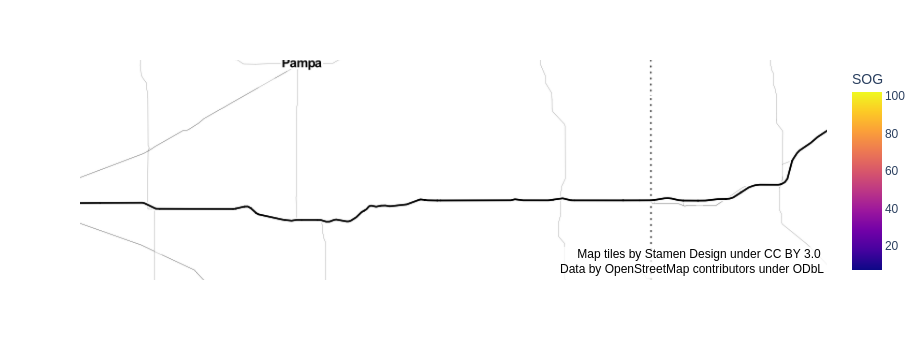

In [10]:
df=pd.read_csv(os.path.join('%s_AIS.csv' % str(year)))
show_plotly(df)

### Download of CMEMS physics and wave data + Merge with AIS data 


In [1]:
# Import of all needed libraries 
!pip install motuclient
import pandas as pd
import requests
import numpy as np
from motu_utils.utils_cas import authenticate_CAS_for_URL
from motu_utils.utils_http import open_url
import xarray as xr
from datetime import datetime, timezone, timedelta 
import time
from pathlib import Path
from bs4 import BeautifulSoup
import sys

In [2]:
# utils to convert dates 
str_to_date = lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
date_to_str = lambda x: x.strftime('%Y-%m-%dT%H:%M:%SZ')
str_to_date2 = lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ')

In [3]:
# input CMEMS credentials
from getpass import getpass
UN_CMEMS = 'mchaveinte'
PW_CMEMS = 'Cuchiagosto23'

In [4]:
def create_request_url(date, lat, lon, datatype):
    """
    Function creates depending on date, latitute and longitude a valid url to request the cmems data using the credentials defined above. 
    Either for the cmems physics or the wave data. 
        
    Parameters
    ----------
    date : str
        datetime as a string as the format YYYY-mm-ddTHH:MM:SSZ
    lat : str, float
        latitude
    lon : str, float
        longitude
    datatype : str 
        describes the type of downloaded data either cmems physics or wave data. 
    """
    y_lo=float(lat)
    y_hi=float(lat)
    x_lo=float(lon)
    x_hi=float(lon)

    if (datatype == 'physics'):

        base_url=['http://nrt.cmems-du.eu/motu-web/Motu?action=productdownload&service=GLOBAL_ANALYSISFORECAST_PHY_001_024-TDS&product=cmems_mod_glo_phy_anfc_0.083deg_P1D-m&variable=siconc&variable=sithick&variable=mlotst&variable=zos&variable=tob&variable=usi&variable=vsi','http://nrt.cmems-du.eu/motu-web/Motu?action=productdownload&service=GLOBAL_ANALYSISFORECAST_PHY_001_024-TDS&product=cmems_mod_glo_phy-thetao_anfc_0.083deg_P1D-m','http://nrt.cmems-du.eu/motu-web/Motu?action=productdownload&service=GLOBAL_ANALYSISFORECAST_PHY_001_024-TDS&product=cmems_mod_glo_phy-so_anfc_0.083deg_P1D-m','http://nrt.cmems-du.eu/motu-web/Motu?action=productdownload&service=GLOBAL_ANALYSISFORECAST_PHY_001_024-TDS&product=cmems_mod_glo_phy-cur_anfc_0.083deg_P1D-m']


        # depth
        z_hi = 0.5
        z_lo = 0.49

        t_lo=date_to_str(str_to_date2(date).replace(hour=12, minute=0, second=0))
        t_hi=t_lo
        
        url = [url_product + '&x_lo={0}&x_hi={1}&y_lo={2}&y_hi={3}&t_lo={4}&t_hi={5}&z_lo={6}&z_hi={7}&mode=console'.format(x_lo, x_hi,y_lo,y_hi,t_lo,t_hi,z_lo,z_hi) for url_product in base_url]

        return [authenticate_CAS_for_URL(x_url , UN_CMEMS, PW_CMEMS) for x_url in url]

    else:

        base_url = 'https://nrt.cmems-du.eu/motu-web/Motu?action=productdownload&service=GLOBAL_ANALYSISFORECAST_WAV_001_027-TDS&product=cmems_mod_glo_wav_anfc_0.083deg_PT3H-i'


        dataset_temporal_resolution = 180
        time_in_min = (str_to_date2(date).hour * 60) + str_to_date2(date).minute
        rest = time_in_min % dataset_temporal_resolution
        t_lo = date_to_str((str_to_date2(date) - timedelta(minutes=rest)).replace(second=0))
        t_hi = t_lo

        url = base_url+'&x_lo={0}&x_hi={1}&y_lo={2}&y_hi={3}&t_lo={4}&t_hi={5}&mode=console'.format(x_lo, x_hi, y_lo, y_hi, t_lo, t_hi)

        return authenticate_CAS_for_URL(url , UN_CMEMS, PW_CMEMS)

In [5]:
def retrive_and_interpolate_data(date, lat, lon, dataset_temporal_resolution, datatype):
    """
    Function to retrive all variables from dataset for a specific timestamp, latitude, longitude concidering the temporal resolution of the dataset to calculate interpolated values. 
    To get a higher number of data faster in cmems physics datasets, only the next lower data point is searched, not also the higher one. Accordingly, some lines of code are commented out. 

    Parameters
    ----------
    date : datetime object
        datetime as a date object
    lat : str, float
        latitude
    lon : str, float
        longitude
    dataset_temporal_resolution: int
        the temporal resolution of the dateset (in hours)
    datatype : str 
        describes the type of downloaded data either cmems physics or wave data. 
    """
    h = date.hour 
    rest = h % dataset_temporal_resolution 
    if rest == 0:
        url = create_request_url(date_to_str(date), lat, lon, datatype)
        if(datatype == 'physics'):
            date = [xr.open_dataset(open_url(x_url).read()) for x_url in url]

            numpy_array_list = []
            for x in date:
                numpy_array = np.ravel(x.to_dataframe().reset_index(drop=True).values)
                numpy_array_list.append(numpy_array)

            return  np.concatenate(numpy_array_list) 

        else:
            date = xr.open_dataset(open_url(url).read())
            return np.ravel(date.to_dataframe().reset_index(drop=True).values)
        
            
    else:
        nearest_lower = date - timedelta(hours= rest)
        #nearest_upper = date + timedelta(hours=dataset_temporal_resolution-rest)
        
        url_lower = create_request_url(date_to_str(nearest_lower), lat, lon, datatype)
        #url_upper = create_request_url(date_to_str(nearest_upper), lat, lon, datatype)
        
        
        
        try:
            if(datatype == 'physics'):
                data_lower =  [xr.open_dataset(open_url(x_url).read()) for x_url in url_lower]
                #data_upper = [xr.open_dataset(open_url(x_url).read()) for x_url in url_upper] 
            else:
                nearest_upper = date + timedelta(hours=dataset_temporal_resolution-rest)
                url_upper = create_request_url(date_to_str(nearest_upper), lat, lon, datatype)
                bytes_lower = open_url(url_lower).read()
                bytes_upper = open_url(url_upper).read()
                data_lower = xr.open_dataset(bytes_lower)
                data_upper = xr.open_dataset(bytes_upper) 
        except:
            # print the error tag from html
            print(BeautifulSoup(bytes_lower, 'html.parser').find('p', {"class": "error"}))
            print(BeautifulSoup(bytes_upper, 'html.parser').find('p', {"class": "error"}))
       
      
        if(datatype == 'physics'):

            list_lower = []
            #list_upper=[]
            for x in data_lower:
                numpy_array = np.ravel(x.to_dataframe().reset_index(drop=True).values)
                list_lower.append(numpy_array)
            #for y in data_upper:
                #numpy_array = np.ravel(y.to_dataframe().reset_index(drop=True).values)
                #list_upper.append(numpy_array)

            # Concatenate the NumPy arrays into one array
            v_lower = np.concatenate(list_lower)  
            #v_upper = np.concatenate(list_upper)
            
            return np.ravel(v_lower)

            # temporal interpolation 
            #alpha = rest / dataset_temporal_resolution
            #return np.ravel((1- alpha)* v_lower + (alpha * v_upper))

        else:
            v_lower = data_lower.to_dataframe().reset_index(drop=True)
            v_upper = data_upper.to_dataframe().reset_index(drop=True)


            # temporal interpolation 
            alpha = rest / dataset_temporal_resolution
            return np.ravel((1- alpha)* v_lower.values + (alpha * v_upper.values))

In [6]:
def append_enviorment_data(year,file_name,start,end):
    """
    Function which merges the downloaded data into one dataframe.  
        
    Parameters
    ----------
    year : int
        datetime as a string as the format YYYY-mm-ddTHH:MM:SSZ 
    """

    src_csv_path =Path('../%s_AIS.csv' % year)
    output_csv_path = Path('%s_AIS_merged_PARTE2_%s_26_04_2023.csv' % (year, file_name))
    
    # get extracted AIS data and remove index column
    df = pd.read_csv(src_csv_path,parse_dates=['BaseDateTime'], date_parser=str_to_date)
    df.drop(['Unnamed: 0'], axis=1, errors='ignore', inplace=True)
    
    # define new columns for the output datafarme 
    cols = list(df.columns) + ['VHM0_WW', 'VMDR_SW2', 'VTM10', 'VMDR_SW1','VMDR', 'VTPK', 'VPED', 'VTM02', 'VTM01_SW2', 'VHM0_SW1', 'VMDR_WW', 'VTM01_SW1', 'VSDX', 'VSDY', 'VHM0', 'VTM01_WW', 'VHM0_SW2'] + ['mlotst', 'siconc', 'bottomT', 'usi', 'sithick', 'vsi', 'zos', 'thetao', 'so', 'vo', 'uo']


    # check if already appended data to resume in case of disconnetion or other errors
    data_list = []
    if Path(output_csv_path).exists():
        data_list = list(pd.read_csv(output_csv_path).drop(['Unnamed: 0'], axis=1, errors='ignore').values)
        len_output=len(data_list)+start
        print('Resuming download from row %s ' % len_output)
        
    # loop over the AIS data starting from the last index, where it has stopped
    last_index = len(data_list)
    #for x in df.values[last_index:]:
    for x in df.values[last_index+start:end]:
        date, lat, lon = x[:3]

        env_variables = retrive_and_interpolate_data(date, lat, lon, 3, 'wave')

        phy_variables = retrive_and_interpolate_data(date, lat, lon, 3, 'physics')

        data_list.append(np.concatenate([x, env_variables, phy_variables]))
        
        pd.DataFrame(data_list, columns=cols).to_csv(output_csv_path)
        last_index+=1
        sys.stdout.write("\rEntry row index: %s/%s" % (last_index+start, end))
        sys.stdout.flush()
        
    return pd.DataFrame(data_list, columns=cols)

In [ ]:
year=2022
file_name=11
while(len(pd.read_csv(Path('%s_AIS_merged_PARTE2_%s_26_04_2023.csv' % (year, file_name))))<=4999):
    try:
        result = append_enviorment_data(2022,11,70001,75000)
    except Exception as e:
        # mostrar el error y reintentar bucle
        print(e)
        continue


Resuming download from row 72540 
HTTP Error 500: 
Resuming download from row 72540 
Entry row index: 72546/75000did not find a match in any of xarray's currently installed IO backends ['netcdf4', 'scipy', 'pydap', 'zarr']. Consider explicitly selecting one of the installed engines via the ``engine`` parameter, or installing additional IO dependencies, see:
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html
https://docs.xarray.dev/en/stable/user-guide/io.html
Resuming download from row 72546 
Entry row index: 72549/75000

In [7]:
result = append_enviorment_data(2022,11,70001,75000)

Entry row index: 70002/75000


KeyboardInterrupt



In [29]:
len(df)

197471

In [37]:
print("hola")

hola


In [23]:
year=2022
pd.read_csv(Path('%s_AIS_merged_PARTE2_1_26_04_2023.csv' % year))

,Unnamed: 0,BaseDateTime,LAT,LON,SOG,COG,Heading,IMO,VesselType,Status,...,siconc,bottomT,usi,sithick,vsi,zos,thetao,so,vo,uo
0,0,2022-01-15 07:25:25,47.13891,-91.11550,7.7,71.0,69.0,IMO7514701,70.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2022-01-15 07:27:45,47.14072,-91.10834,8.1,70.1,69.0,IMO7514701,70.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
